# Preprocessing

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import glob
import os
import gzip
import itertools
import yaml
import re
import matplotlib.pyplot as plt
from collections import Counter, defaultdict, OrderedDict
from scipy.stats import gaussian_kde
from scipy.special import comb
from Bio import SeqIO

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.10.4 anndata==0.11.1 umap==0.5.7 numpy==2.0.2 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.6.0 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


In [3]:
gois = ['LamC', 'Prosalpha3']

In [4]:
txs = ['TX45', 'TX46']

In [5]:
run_dirs = glob.glob(f'../TX4[56]/*LamC') + glob.glob(f'../TX4[56]/*Prosalpha3') + glob.glob('../TX4[56]/*ctrl')
run_dirs.sort()
run_names = [os.path.basename(rd) for rd in run_dirs]
run_labels = [f'{tx} {samp}' for tx in txs for samp in ['ctrl'] + gois]
list(zip(run_dirs, run_names, run_labels))

[('../TX45/DS-0023A_ctrl', 'DS-0023A_ctrl', 'TX45 ctrl'),
 ('../TX45/DS-0023C_LamC', 'DS-0023C_LamC', 'TX45 LamC'),
 ('../TX45/DS-0023D_Prosalpha3', 'DS-0023D_Prosalpha3', 'TX45 Prosalpha3'),
 ('../TX46/DS-0024E_ctrl', 'DS-0024E_ctrl', 'TX46 ctrl'),
 ('../TX46/DS-00250_LamC', 'DS-00250_LamC', 'TX46 LamC'),
 ('../TX46/DS-00251_Prosalpha3', 'DS-00251_Prosalpha3', 'TX46 Prosalpha3')]

In [6]:
for dname in ['write', 'figures']:
    if not os.path.exists(dname):
        os.mkdir(dname)

In [7]:
sub_results_files = ['write/{}.h5ad'.format(run_name) for run_name in run_names]
# the file that will store the analysis results
comb_results_file = 'write/combined.h5ad'

## Knee Plot

In [8]:
sub_adatas = [
    sc.read_10x_mtx(
    '{}/counts/outs/raw_feature_bc_matrix/'.format(run_dir),  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading
    for run_dir in run_dirs
]

... reading from cache file cache/..-TX45-DS-0023A_ctrl-counts-outs-raw_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-TX45-DS-0023C_LamC-counts-outs-raw_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX45-DS-0023D_Prosalpha3-counts-outs-raw_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-0024E_ctrl-counts-outs-raw_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-00250_LamC-counts-outs-raw_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-00251_Prosalpha3-counts-outs-raw_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [9]:
for adata in sub_adatas:
    adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
def gzip_friendly_open(fpath):
    if fpath.endswith('.gz'):
        return gzip.open(fpath, 'rt')
    else:
        return open(fpath)

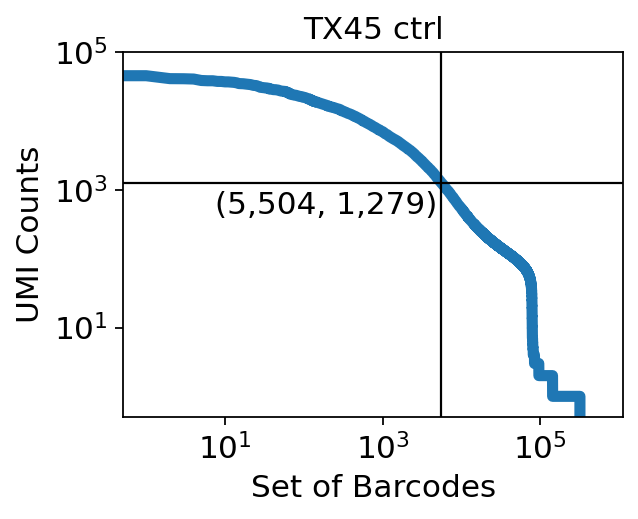

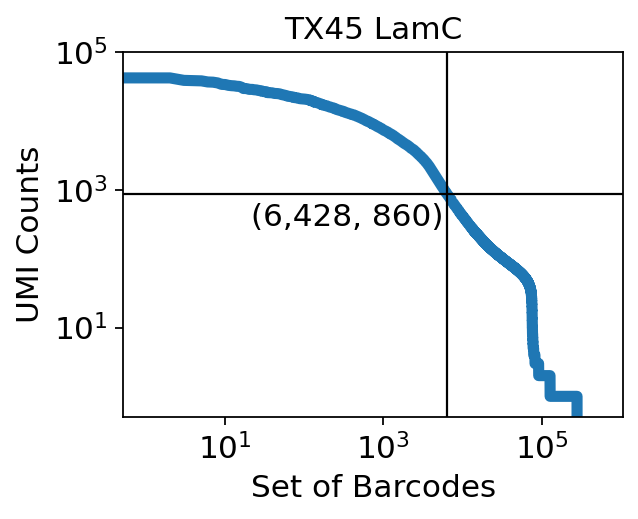

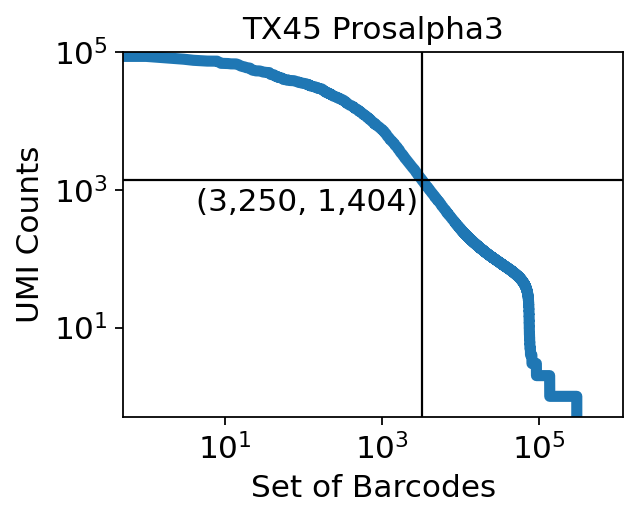

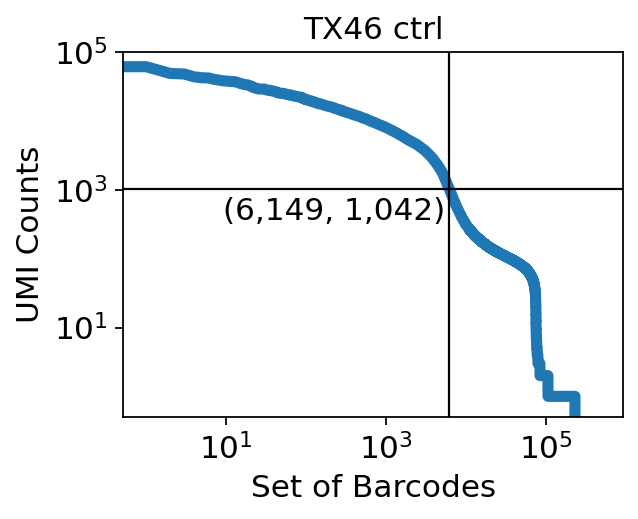

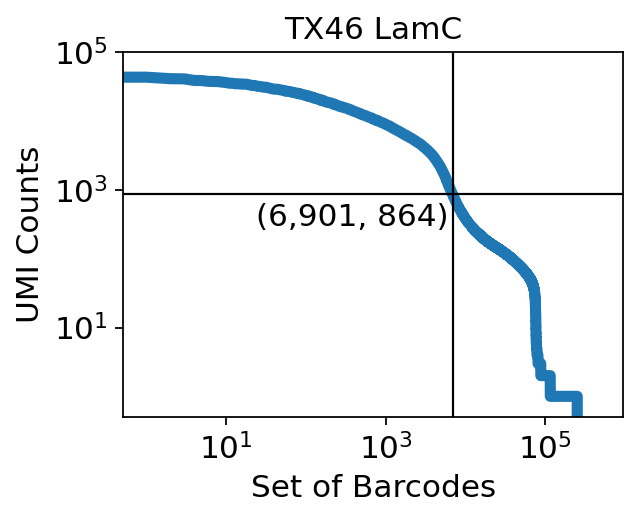

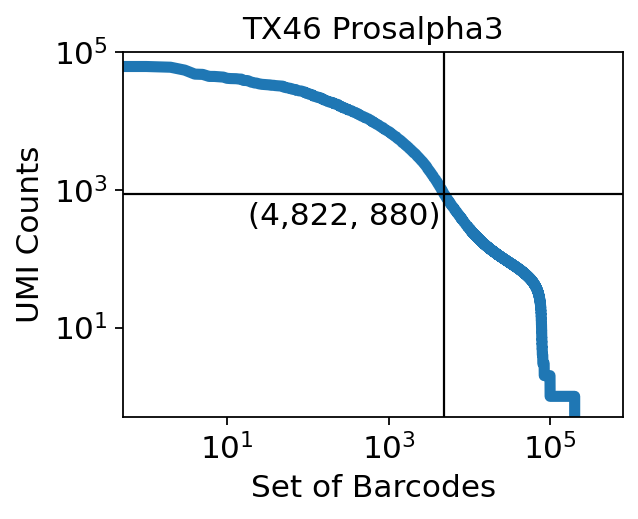

In [11]:
num_cells_above_knee = []
bc_cutoffs = [
    sum(1 for line in gzip_friendly_open(f'{run_dir}/counts/outs/filtered_feature_bc_matrix/barcodes.tsv.gz'))
    for run_dir in run_dirs
]
umi_cutoffs = []
for adata, run_label, bc_cutoff in zip(sub_adatas, run_labels, bc_cutoffs):
    knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]

    #umi_cutoff = 1000
    #num_cells = next(i for i, val in enumerate(knee) if val < umi_cutoff) - 1
    num_cells = bc_cutoff
    num_cells_above_knee.append(num_cells)
    umi_cutoff = knee[num_cells]
    umi_cutoffs.append(umi_cutoff)

    fig, ax = plt.subplots(figsize=(4, 3))

    ax.loglog(range(len(knee)), knee, linewidth=5)
    xx = num_cells
    yy = knee[num_cells]
    ax.axvline(x=xx, linewidth=1, color="k")
    ax.axhline(y=yy, linewidth=1, color="k")
    ax.text(0.9*xx, 0.75*yy, '({:,d}, {:,d})'.format(int(xx), int(yy)), ha='right', va='top')
    

    ax.set_ylabel("UMI Counts")
    ax.set_xlabel("Set of Barcodes")
    ax.set_title(run_label)
    
    ax.set_ylim((0.5, 1e5))

    plt.grid(False, which="both")
    plt.show()


In [12]:
raw_shapes = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
raw_shapes

[(569047, 13942),
 (546962, 13942),
 (605087, 13942),
 (472964, 13942),
 (486146, 13942),
 (410587, 13942)]

In [13]:
adata.var

,gene_ids,feature_types
Myo81F,FBgn0267431,Gene Expression
Pzl,FBgn0267430,Gene Expression
spok,FBgn0086917,Gene Expression
Parp,FBgn0010247,Gene Expression
Alg-2,FBgn0086378,Gene Expression
...,...,...
mt:ND4,FBgn0262952,Gene Expression
mt:ND4L,FBgn0013683,Gene Expression
mt:ND6,FBgn0013685,Gene Expression
mt:Cyt-b,FBgn0013678,Gene Expression


## Preprocessing

In [14]:
sub_adatas = [
    sc.read_10x_mtx(
    '{}/counts/outs/filtered_feature_bc_matrix/'.format(run_dir),  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading
    for run_dir in run_dirs
]

... reading from cache file cache/..-TX45-DS-0023A_ctrl-counts-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-TX45-DS-0023C_LamC-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX45-DS-0023D_Prosalpha3-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-0024E_ctrl-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-00250_LamC-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


... reading from cache file cache/..-TX46-DS-00251_Prosalpha3-counts-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [15]:
for adata in sub_adatas:
    adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [16]:
for i, run_label in enumerate(run_labels):
    sub_adatas[i].uns['sample'] = run_label

In [17]:
adata_shapes = OrderedDict()
adata_shapes['10X filtered'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)])])

In [18]:
type(adata)

anndata._core.anndata.AnnData

In [19]:
adata

AnnData object with n_obs × n_vars = 4822 × 13942
    var: 'gene_ids', 'feature_types'
    uns: 'sample'

normalizing counts per cell
    finished (0:00:00)


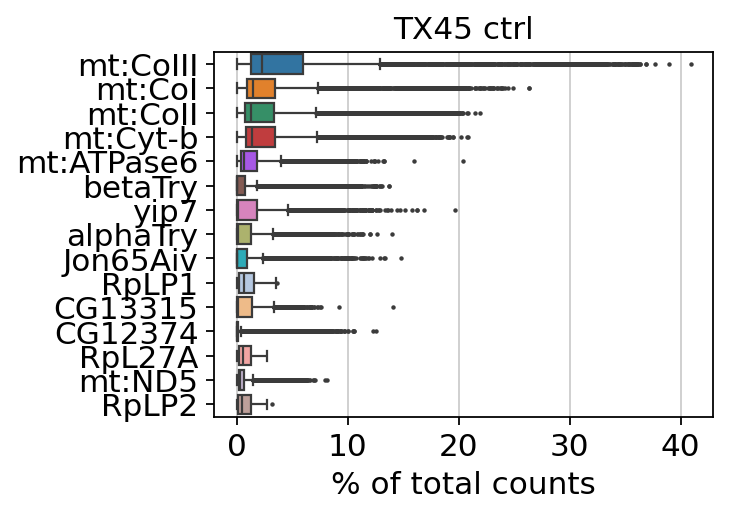

normalizing counts per cell
    finished (0:00:00)


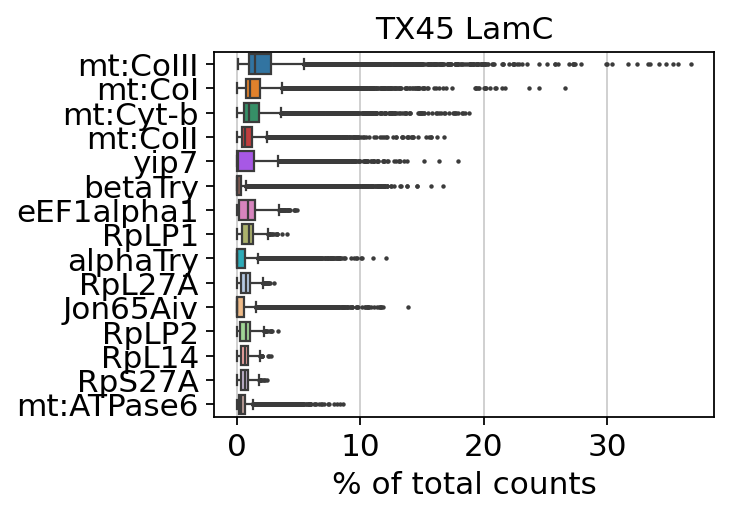

normalizing counts per cell
    finished (0:00:00)


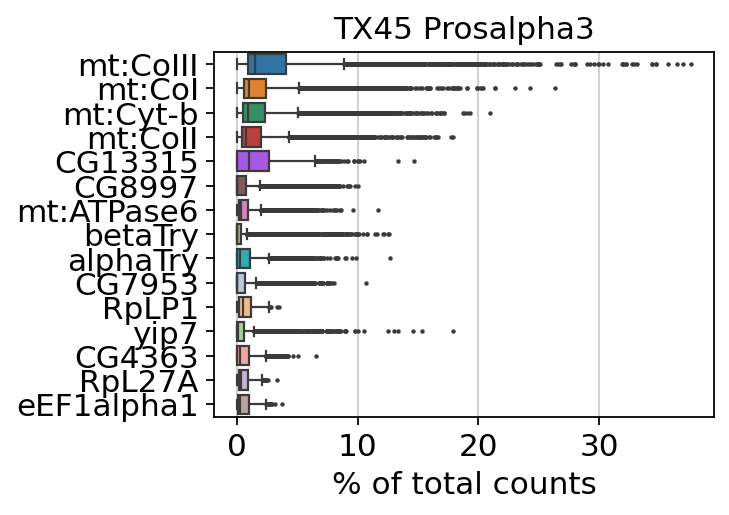

normalizing counts per cell
    finished (0:00:00)


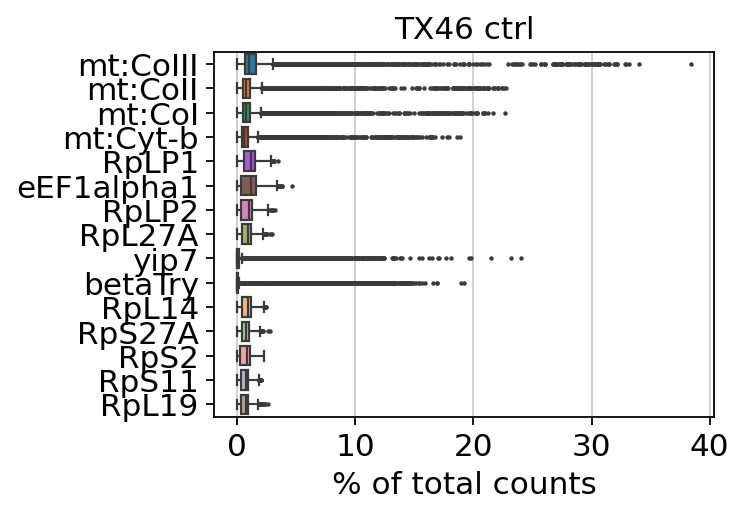

normalizing counts per cell
    finished (0:00:00)


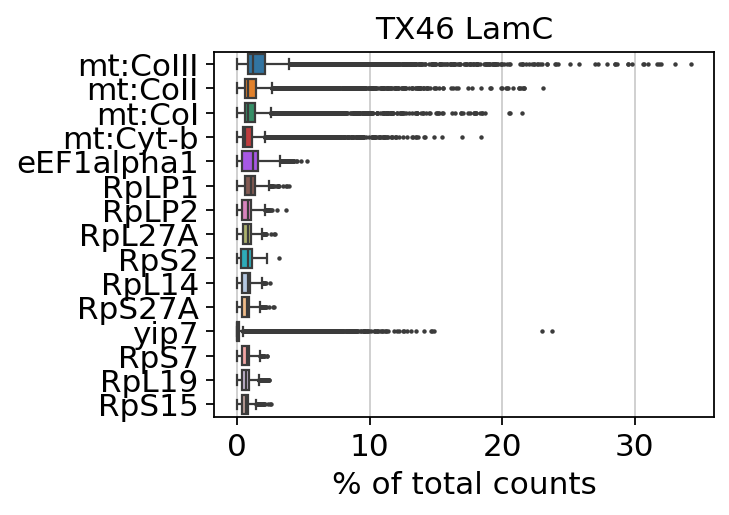

normalizing counts per cell
    finished (0:00:00)


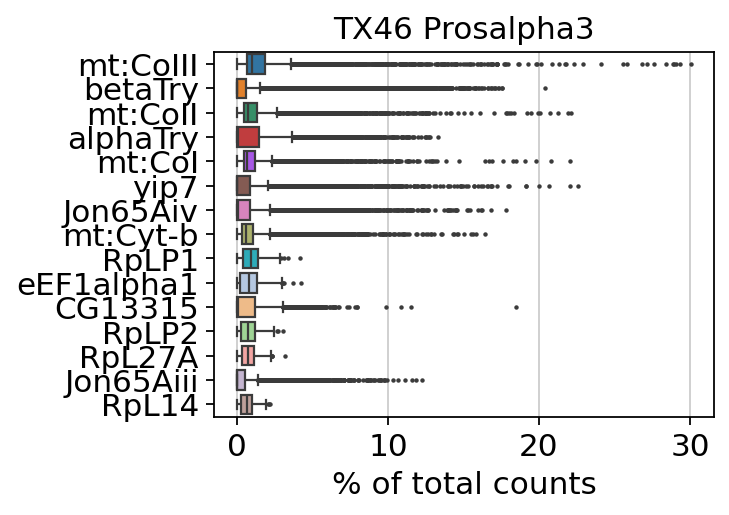

In [20]:
for adata, run_label in zip(sub_adatas, run_labels):
    fig, ax = plt.subplots(figsize=(4, 3))
    ax.set_title(run_label)
    sc.pl.highest_expr_genes(adata, n_top=15, ax=ax)

In [21]:
for i in range(len(sub_adatas)):
    sub_adatas[i].var['mt'] = sub_adatas[i].var_names.str.startswith('mt:')  # annotate the group of mitochondrial genes as 'mt'
    sub_adatas[i] = sub_adatas[i][:, sub_adatas[i].var['mt'].isin((True, False))].copy()  # Remove nan values
    sub_adatas[i].var['mt'] = sub_adatas[i].var_names.str.startswith('mt:')  # recasts as a proper adata object. Not clear how or why necessary.
    sc.pp.calculate_qc_metrics(sub_adatas[i], qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

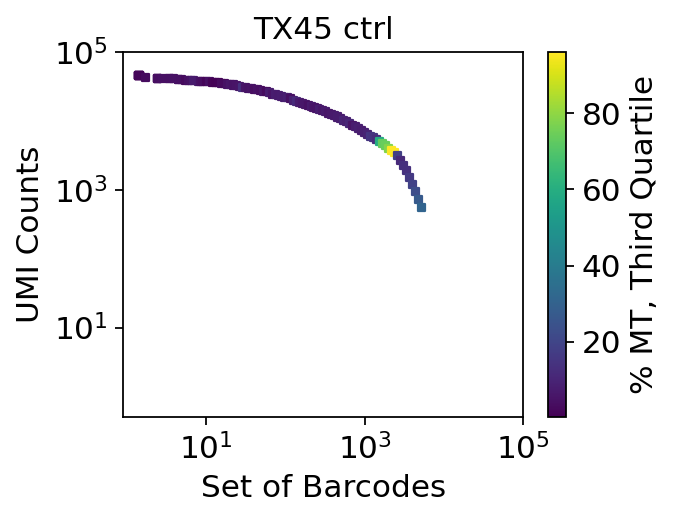

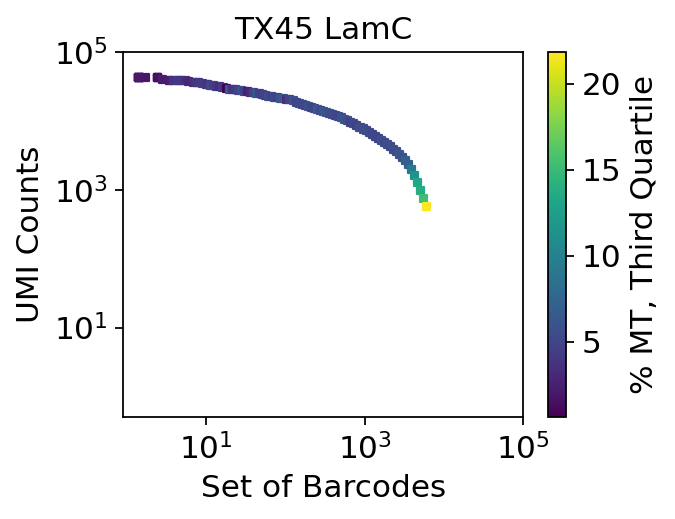

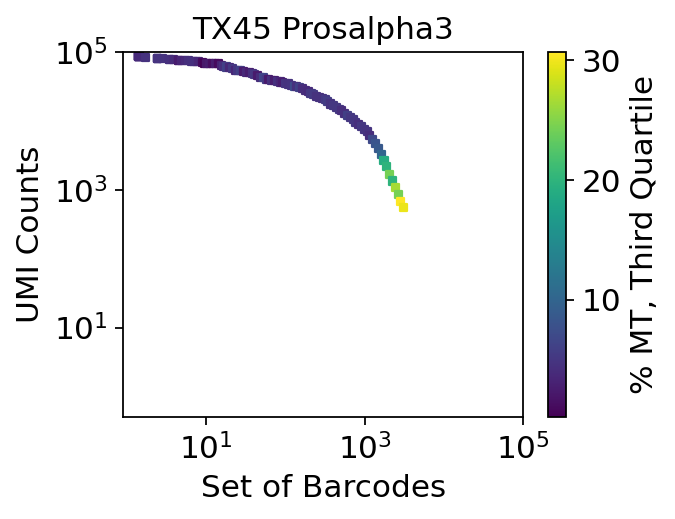

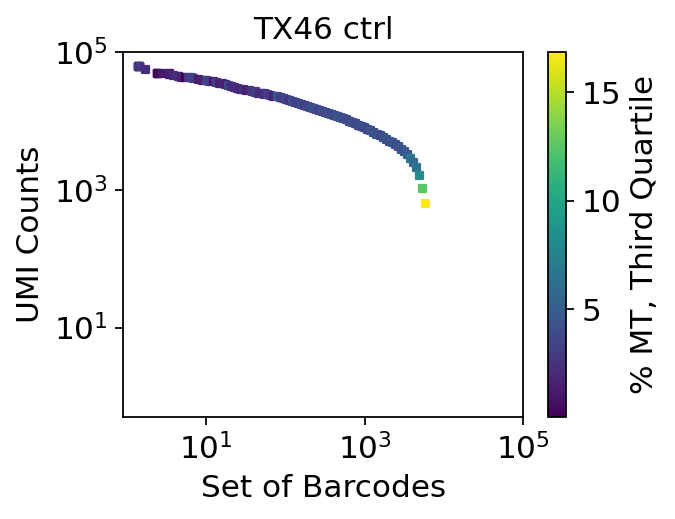

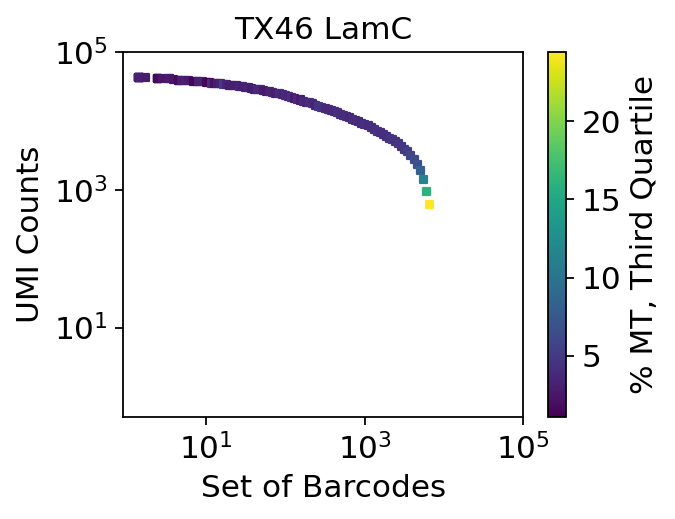

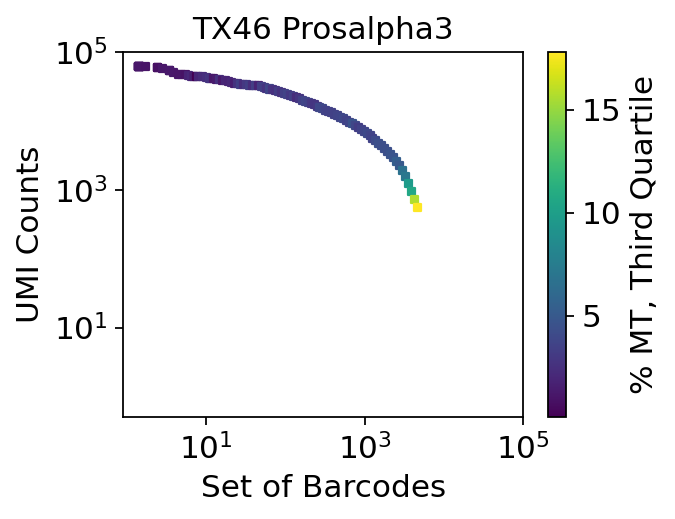

In [22]:
num_cells_above_knee = []
for adata in sub_adatas:
    
    vals = [(umis, mt_pct) for umis, mt_pct in 
            zip((np.array(adata.X.sum(axis=1))).flatten(), adata.obs.pct_counts_mt)]
    vals.sort(reverse=True)
    breaks = np.logspace(np.log10(1), np.log10(len(vals)), 100)
    x, y, c = [], [], []
    for b1, b2 in zip(breaks, breaks[1:]):
        if b2 - b1 < 1:
            b1 = np.floor(b1)
            b2 = np.ceil(b2)
        x.append(np.exp((np.log(b1)+np.log(b2))/2))
        y.append(np.average([umis for i, (umis, mt_pct) in enumerate(vals) if b1 <= i < b2]))
        top_pct = np.percentile([mt_pct for i, (umis, mt_pct) in enumerate(vals) if b1 <= i < b2], 75)
        #c.append(np.average([mt_pct for i, (umis, mt_pct) in enumerate(vals) if b1 <= i < b2 and mt_pct >= top_pct]))
        c.append(top_pct)

    umi_cutoff = 1000
    num_cells = next(i for i, (umis, mt_pct) in enumerate(vals) if umis < umi_cutoff) - 1
    num_cells_above_knee.append(num_cells)

    fig, ax = plt.subplots(figsize=(4, 3))

    ax.set_xscale('log')
    ax.set_yscale('log')
    scplt = ax.scatter(x, y, c=c, s=10, marker='s')
    xx = num_cells
    yy = umi_cutoff
    
    cbar = plt.colorbar(scplt)
    cbar.set_label('% MT, Third Quartile')

    ax.set_ylabel("UMI Counts")
    ax.set_xlabel("Set of Barcodes")
    ax.set_title(adata.uns['sample'])
    
    ax.set_ylim((0.5, 1e5))
    ax.set_xlim((0.9, 1e5))

    plt.grid(False, which="both")
    plt.show()


In [23]:
mt_genes = [
    'mt:ATPase6',
    'mt:ATPase8',
    'mt:CoI',
    'mt:CoII',
    'mt:CoIII',
    'mt:Cyt-b',
    'mt:ND1',
    'mt:ND2',
    'mt:ND3',
    'mt:ND4',
    'mt:ND4L',
    'mt:ND5',
    'mt:ND6',
]

In [24]:
missing = False
for adata in sub_adatas:
    obs_mt_genes = [gene for gene in adata.var.index if gene.startswith('mt:')]
    missing_mt_genes = set(mt_genes) - set(obs_mt_genes)
    if missing_mt_genes:
        print('{} sample missing:'.format(adata.uns['sample']))
        print(missing_mt_genes)
        missing = True
if not missing:
    print('All mt genes observed in all samples')

All mt genes observed in all samples


#### Filter by UMI count

In [25]:
adata_shapes['umi thresholding'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('umi thresholding',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)])])

#### Filtering for min gene count

In [26]:
for adata in sub_adatas:
    sc.pp.filter_cells(adata, min_genes=200)

filtered out 454 cells that have less than 200 genes expressed
filtered out 65 cells that have less than 200 genes expressed
filtered out 55 cells that have less than 200 genes expressed
filtered out 98 cells that have less than 200 genes expressed
filtered out 62 cells that have less than 200 genes expressed
filtered out 45 cells that have less than 200 genes expressed


In [27]:
adata_shapes['cell min_genes=200'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('umi thresholding',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('cell min_genes=200',
              [(5050, 13942),
               (6363, 13942),
               (3195, 13942),
               (6051, 13942),
               (6839, 13942),
               (4777, 13942)])])

#### Filtering genes for min_cells

In [28]:
for adata in sub_adatas:
    sc.pp.filter_genes(adata, min_cells=3)

filtered out 5307 genes that are detected in less than 3 cells
filtered out 4814 genes that are detected in less than 3 cells
filtered out 4983 genes that are detected in less than 3 cells
filtered out 4904 genes that are detected in less than 3 cells
filtered out 4643 genes that are detected in less than 3 cells
filtered out 4865 genes that are detected in less than 3 cells


In [29]:
adata_shapes['gene min_cells=3'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('umi thresholding',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('cell min_genes=200',
              [(5050, 13942),
               (6363, 13942),
               (3195, 13942),
               (6051, 13942),
               (6839, 13942),
               (4777, 13942)]),
             ('gene min_cells=3',
              [(5050, 8635),
               (6363, 9128),
               (3195, 8959),
               (6051, 9038),
               (6839, 9299),
               (4777, 9077)])])

In [30]:
sub_adatas[3].obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes
AAACCTGAGAAACGCC-1,1214,2872.0,98.0,3.412256,1214
AAACCTGAGACTAAGT-1,1180,4584.0,593.0,12.936300,1180
AAACCTGAGCTGCAAG-1,1371,4718.0,130.0,2.755405,1371
AAACCTGCAAGCCCAC-1,810,2966.0,156.0,5.259609,810
AAACCTGGTCAATGTC-1,1701,6451.0,284.0,4.402418,1701
...,...,...,...,...,...
TTTGTCACACCATCCT-1,1868,9743.0,87.0,0.892949,1868
TTTGTCACACTGTTAG-1,865,4449.0,807.0,18.138908,865
TTTGTCAGTTGCTCCT-1,1218,3943.0,148.0,3.753487,1218
TTTGTCATCAACTCTT-1,2156,10553.0,152.0,1.440349,2156


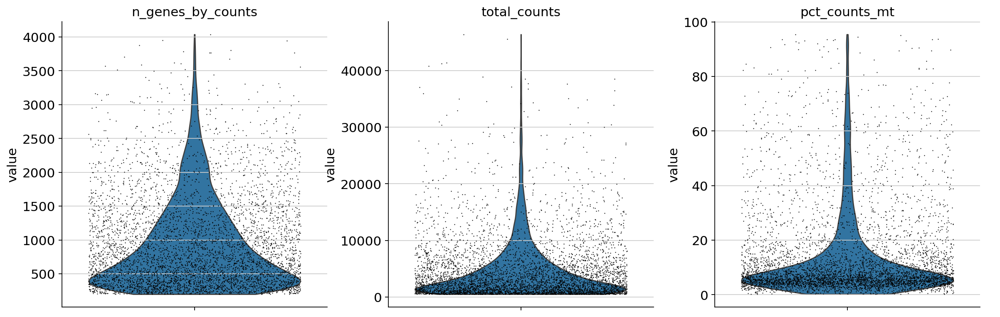

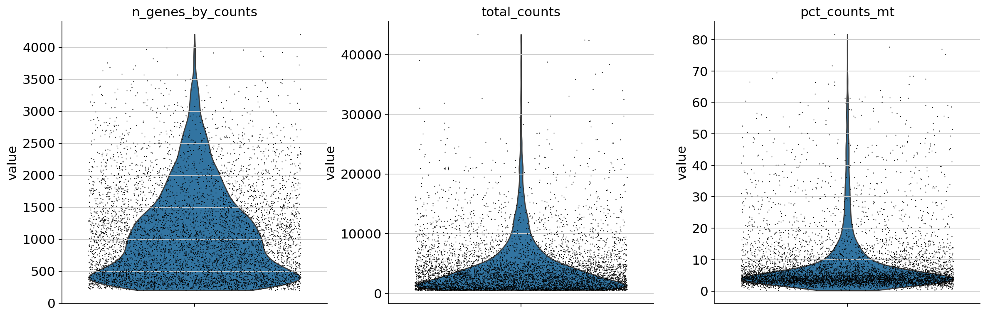

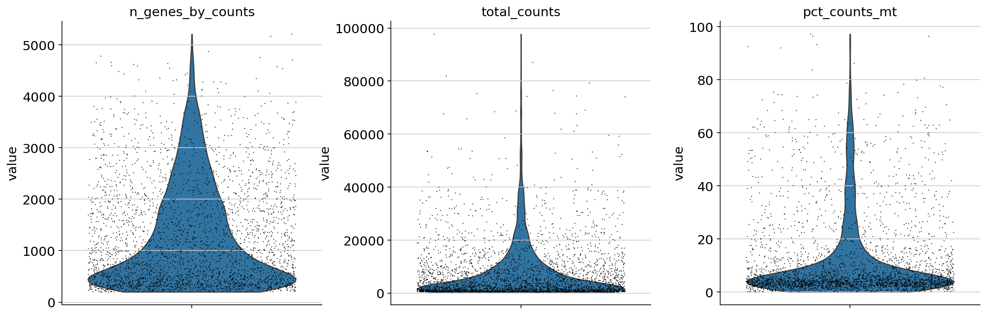

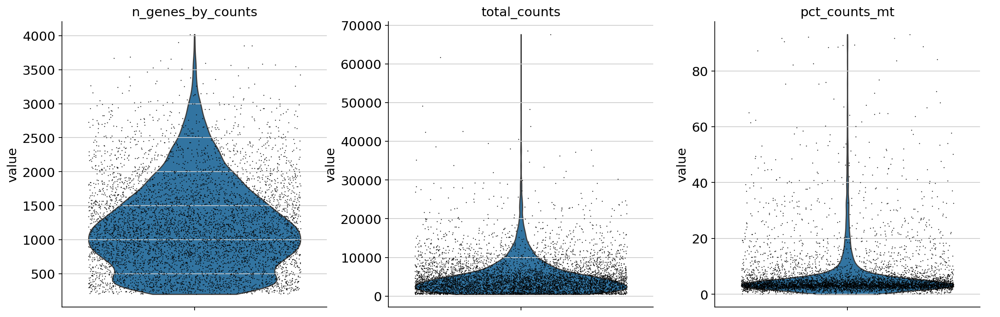

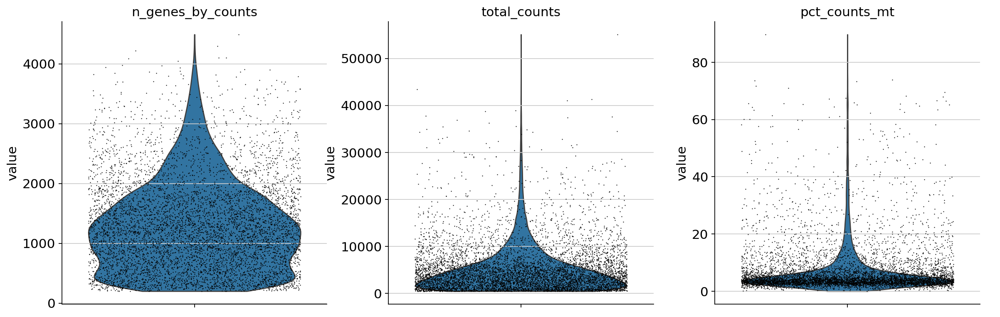

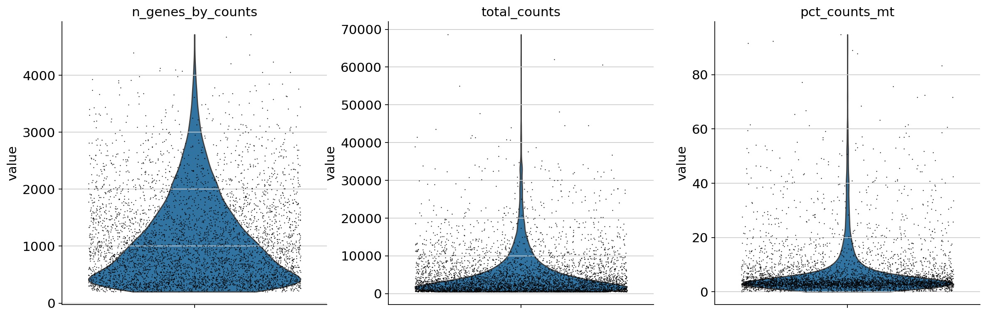

In [31]:
for adata in sub_adatas:
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
                 jitter=0.4, multi_panel=True, xlabel=adata.uns['sample'])

In [32]:
def scatter_density_color(x, y):
    values = np.vstack([x, y])
    kernel = gaussian_kde(values)
    return kernel(values)

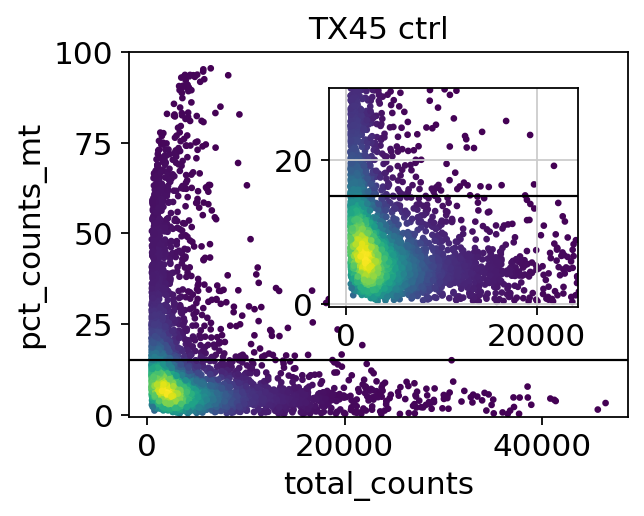

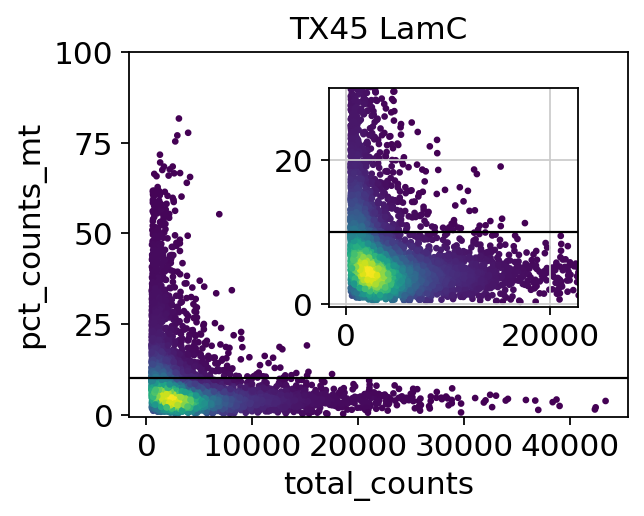

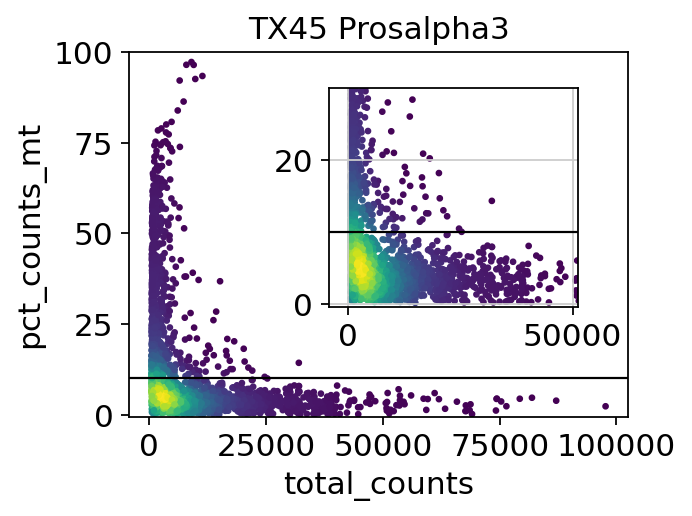

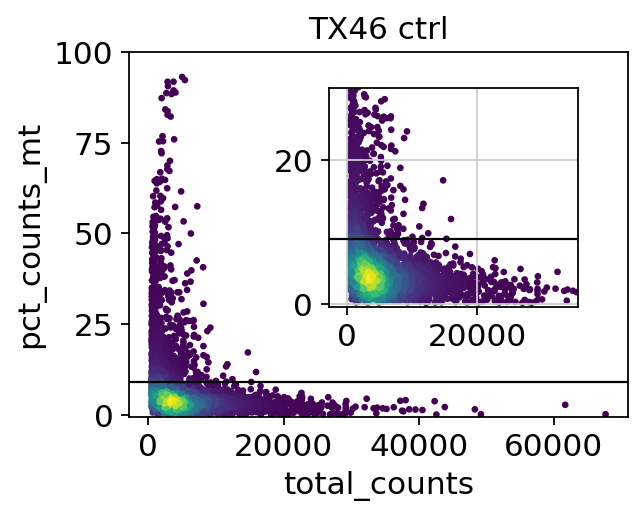

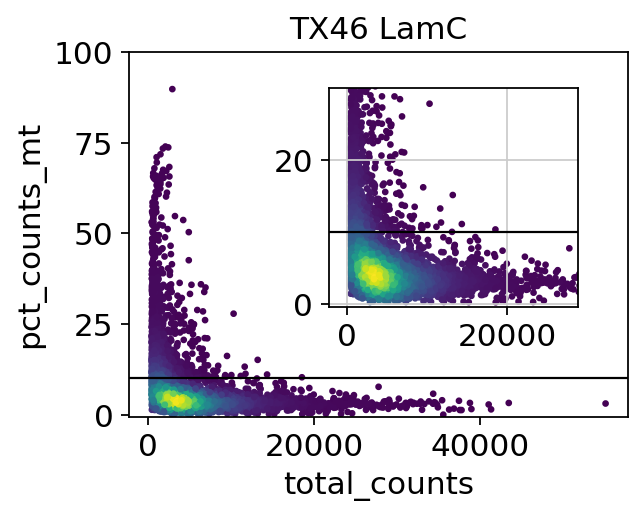

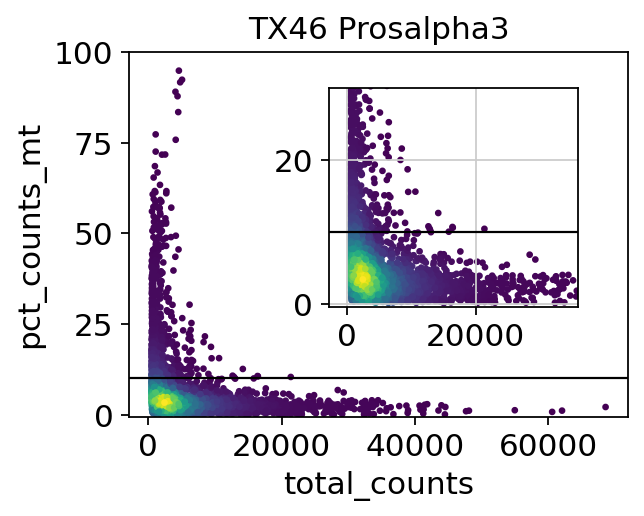

In [33]:
mt_cutoffs = [15, 10, 10, 9, 10, 10]
for adata, mt_cutoff in zip(sub_adatas, mt_cutoffs):
    fig, ax = plt.subplots(figsize=(4, 3))
    xlabel = 'total_counts'
    ylabel = 'pct_counts_mt'
    x = adata.obs[xlabel]
    y = adata.obs[ylabel]
    c = scatter_density_color(x, y)
    cutoff = mt_cutoff
    s=4

    ax.scatter(x, y, s=s, c=c)
    ax.set_ylim((-0.5, 100))
    ax.axhline(y=cutoff, linewidth=1, color="k")

    xlim = ax.get_xlim()
    subax = ax.inset_axes([0.4, 0.3, 0.5, 0.6])
    subax.scatter(x, y, s=s, c=c)
    subax.set_ylim((-0.5, 30))
    subax.set_xlim((xlim[0], xlim[1]/2))
    subax.axhline(y=cutoff, linewidth=1, color="k")

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(adata.uns['sample'])
    ax.grid(False)

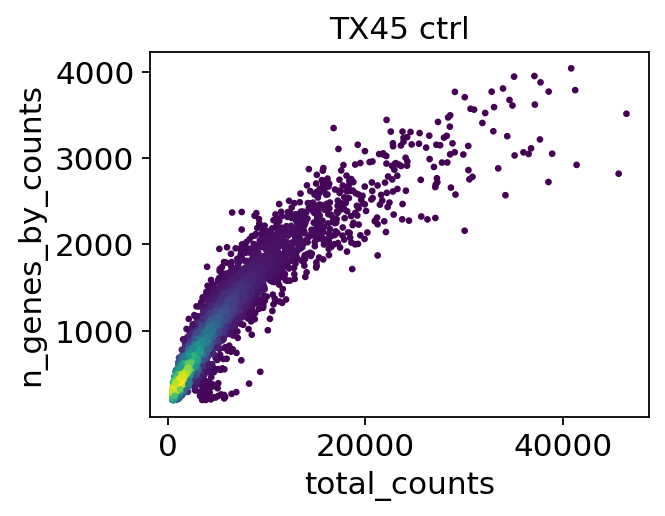

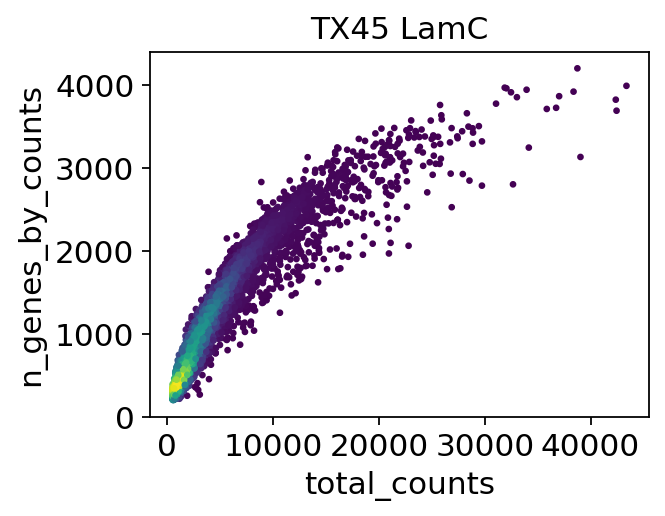

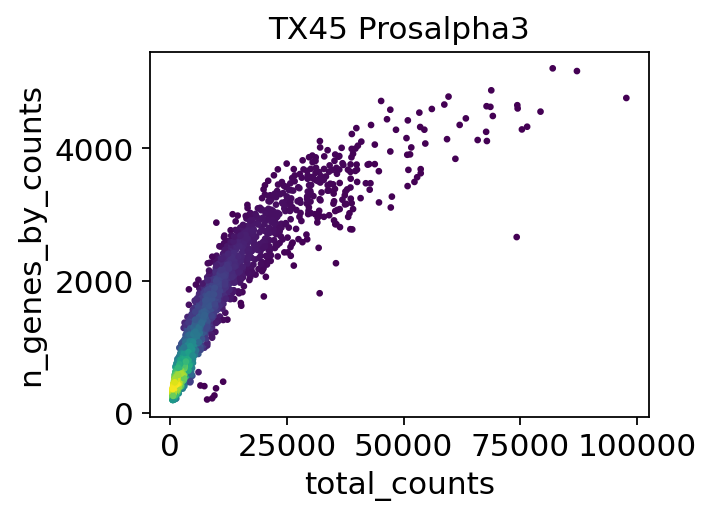

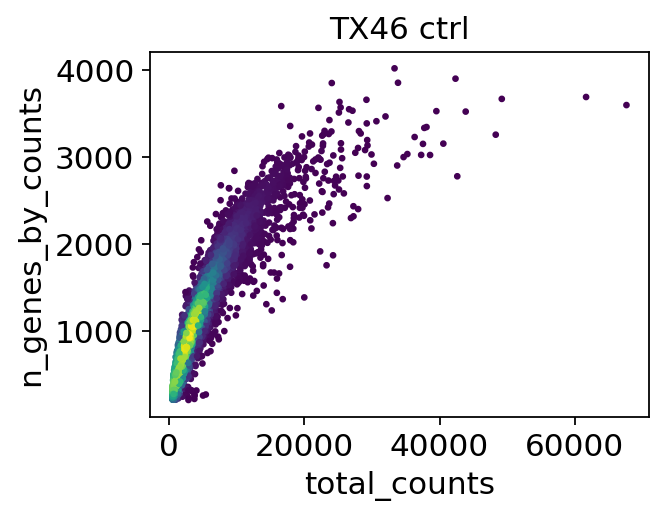

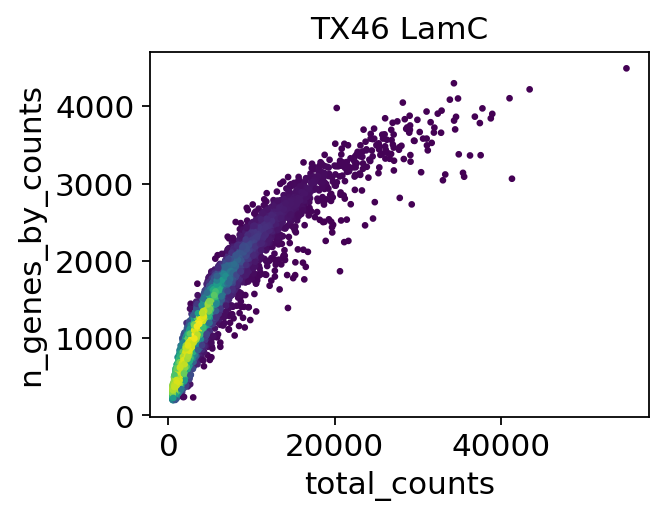

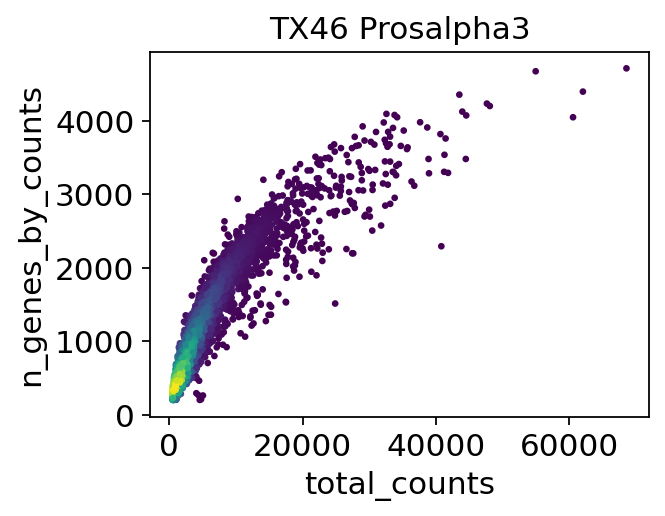

In [34]:
for adata in sub_adatas:
    fig, ax = plt.subplots(figsize=(4, 3))
    xlabel = 'total_counts'
    ylabel = 'n_genes_by_counts'
    x = adata.obs[xlabel]
    y = adata.obs[ylabel]
    c = scatter_density_color(x, y)
    cutoff = 10
    s=4

    ax.scatter(x, y, s=s, c=c)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(adata.uns['sample'])
    ax.grid(False)

#### MT filtering

In [35]:
for i, mt_cutoff in zip(range(len(sub_adatas)), mt_cutoffs):
    adata = sub_adatas[i]
    adata = adata[adata.obs.pct_counts_mt < mt_cutoff, :]
    sub_adatas[i] = adata

In [36]:
adata_shapes['pct_counts_mt thresholding'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('umi thresholding',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('cell min_genes=200',
              [(5050, 13942),
               (6363, 13942),
               (3195, 13942),
               (6051, 13942),
               (6839, 13942),
               (4777, 13942)]),
             ('gene min_cells=3',
              [(5050, 8635),
               (6363, 9128),
               (3195, 8959),
               (6051, 9038),
               (6839, 9299),
               (4777, 9077)]),
             ('pct_counts_mt thresholding',
              [(3823, 8635),
               (4997, 9128),
               (2279, 8959),
             

In [37]:
for adata in sub_adatas:
    print('\n', adata.uns['sample'])
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


 TX45 ctrl
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 TX45 LamC
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 TX45 Prosalpha3
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 TX46 ctrl


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 TX46 LamC
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 TX46 Prosalpha3
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


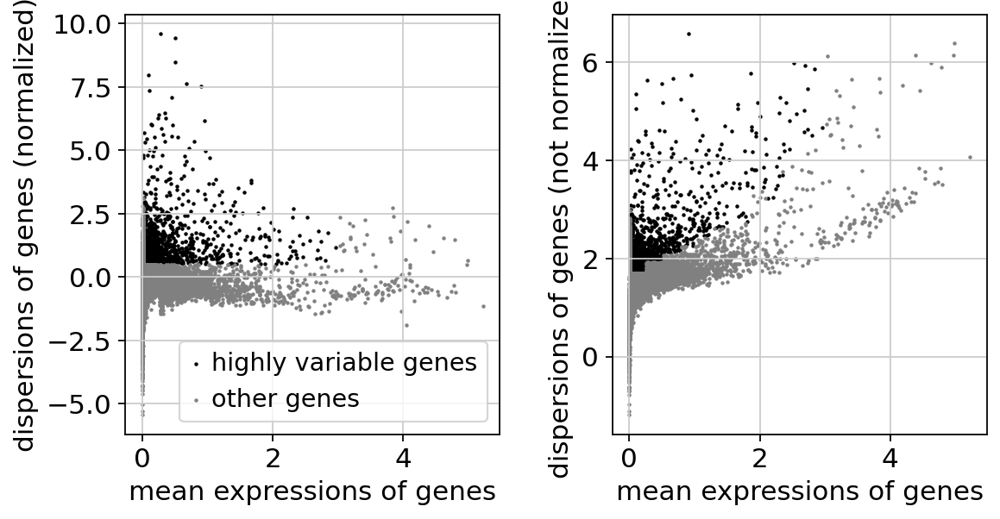

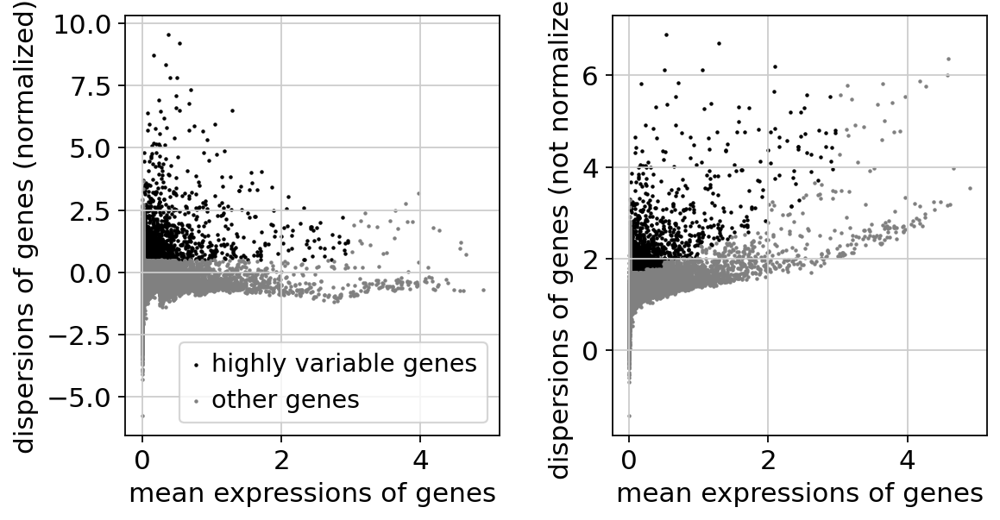

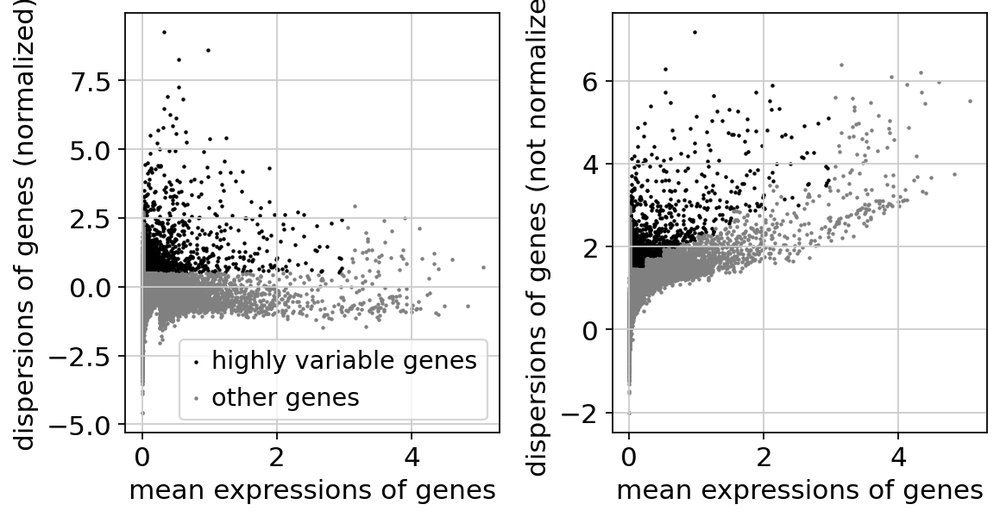

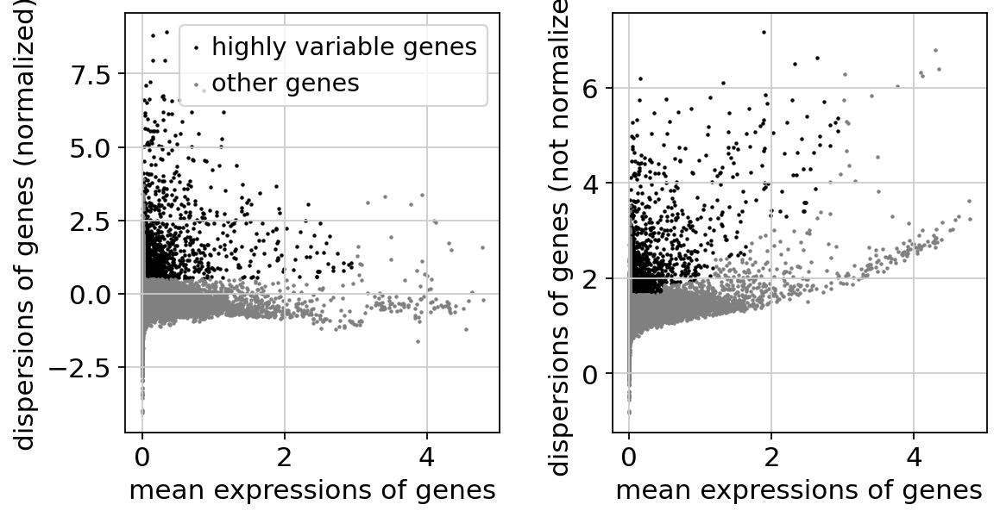

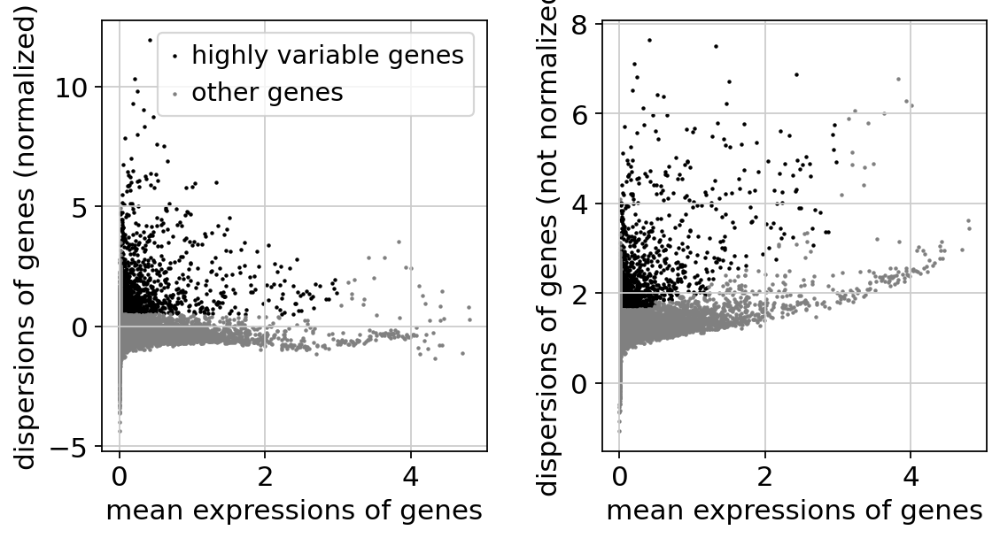

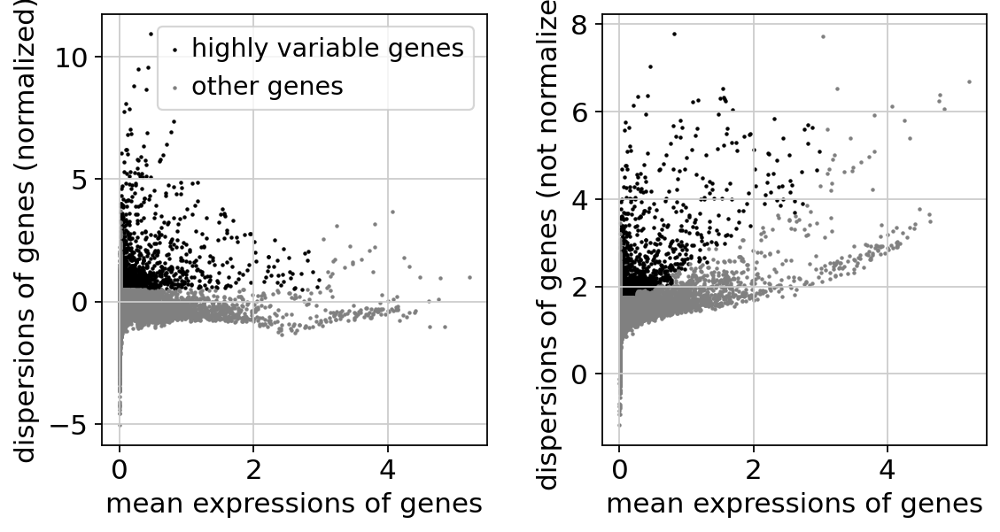

In [38]:
for adata in sub_adatas:
    sc.pl.highly_variable_genes(adata)

In [39]:
for adata in sub_adatas:
    adata.raw = adata

In [40]:
for i in range(len(sub_adatas)):
    sub_adatas[i] = sub_adatas[i][:, sub_adatas[i].var.highly_variable]

In [41]:
adata_shapes['highly variable genes'] = [(adata.n_obs, adata.n_vars) for adata in sub_adatas]
adata_shapes

OrderedDict([('10X filtered',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('umi thresholding',
              [(5504, 13942),
               (6428, 13942),
               (3250, 13942),
               (6149, 13942),
               (6901, 13942),
               (4822, 13942)]),
             ('cell min_genes=200',
              [(5050, 13942),
               (6363, 13942),
               (3195, 13942),
               (6051, 13942),
               (6839, 13942),
               (4777, 13942)]),
             ('gene min_cells=3',
              [(5050, 8635),
               (6363, 9128),
               (3195, 8959),
               (6051, 9038),
               (6839, 9299),
               (4777, 9077)]),
             ('pct_counts_mt thresholding',
              [(3823, 8635),
               (4997, 9128),
               (2279, 8959),
             

In [42]:
for adata in sub_adatas:
    sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale

In [43]:
start_label = '10X filtered'
cell_counts = [(start_label, [ncells for ncells, ngenes in adata_shapes[start_label]])]
start_label = 'gene min_cells=3'
gene_counts = [(start_label, [ngenes for ncells, ngenes in adata_shapes[start_label]])]

for label, shapes in adata_shapes.items():
    if shapes[0][0] < cell_counts[-1][1][0] or 'umi' in label or 'min_gene' in label: # did cell count go down
        cell_counts.append((label, [ncells for ncells, ngenes in shapes]))
    if shapes[0][1] < gene_counts[-1][1][0]: # did cell count go down
        gene_counts.append((label, [ngenes for ncells, ngenes in shapes]))

In [44]:
cell_counts

[('10X filtered', [5504, 6428, 3250, 6149, 6901, 4822]),
 ('umi thresholding', [5504, 6428, 3250, 6149, 6901, 4822]),
 ('cell min_genes=200', [5050, 6363, 3195, 6051, 6839, 4777]),
 ('pct_counts_mt thresholding', [3823, 4997, 2279, 5206, 5726, 4037])]

In [45]:
gene_counts

[('gene min_cells=3', [8635, 9128, 8959, 9038, 9299, 9077]),
 ('highly variable genes', [1675, 1427, 1900, 1266, 1274, 1397])]

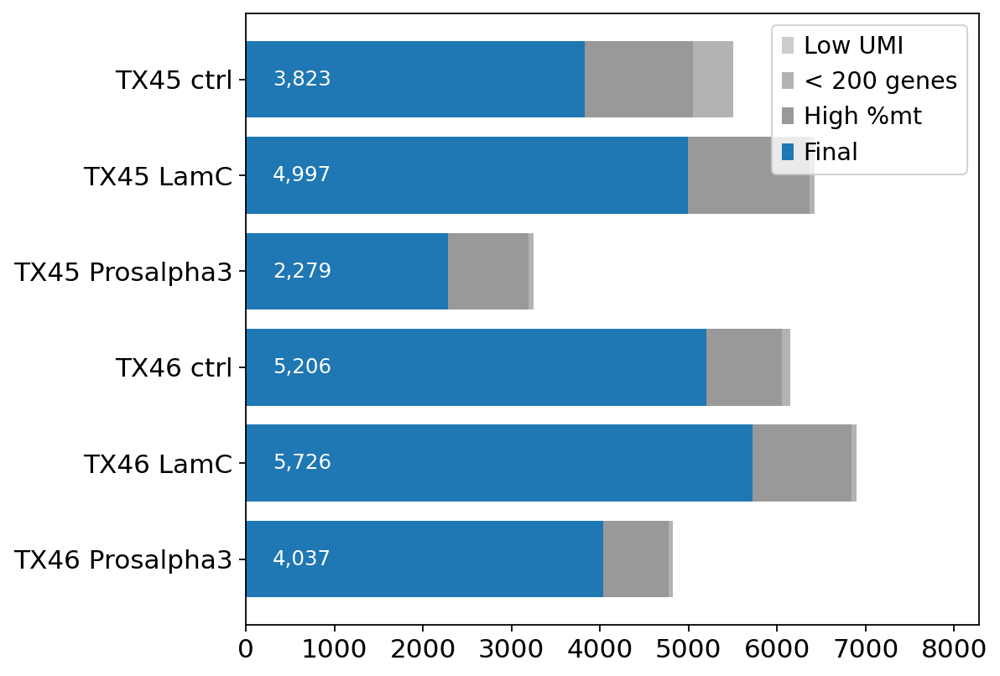

In [46]:
fig, ax = plt.subplots(figsize=(7, 6))

all_run_counts = []
for i, run_label in enumerate(run_labels):
    run_counts = [prev_counts[i] - counts[i] for (_, prev_counts), (_, counts) in zip(cell_counts, cell_counts[1:])]
    run_counts.append(cell_counts[-1][1][i])
    all_run_counts.append(run_counts)
    
yticks = np.arange(len(run_labels))[::-1]
for i, label in enumerate(['Low UMI', '< 200 genes', 'High %mt', 'Final']):
    color = 'C0' if i == 3 else (0.8 - 0.1 * i) * np.ones((3,))
    data = [run_counts[i] for run_counts in all_run_counts]
    bottoms = [sum(run_counts[i+1:]) for run_counts in all_run_counts]
    ax.barh(yticks, data, left=bottoms, height=0.8, color=color, label=label)
    if i == 3:
        for yy, val in zip(yticks, data):
            if val > 1000:
                color = 'w'
            else:
                color = 0.3*np.ones((3,))
            ax.text(300, yy, '{:,d}'.format(val), ha='left', va='center', color=color, fontsize=11)    
    
ax.set_yticks(yticks)
ax.set_yticklabels(run_labels)
ax.set_xlim((0, ax.get_xlim()[1]*1.2))
ax.legend()
ax.grid(False)

fig.savefig('figures/filter_bar_chart.pdf')

## Principal component analysis

In [47]:
random_state = 42

In [48]:
for adata in sub_adatas:
    sc.tl.pca(adata, svd_solver='arpack', random_state=random_state)

computing PCA
    with n_comps=50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)


In [49]:
sub_adatas[0]

AnnData object with n_obs × n_vars = 3823 × 1675
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

TX45 ctrl


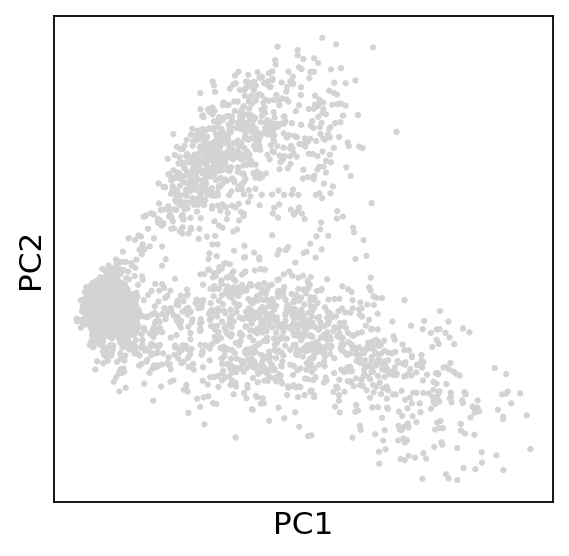

TX45 LamC


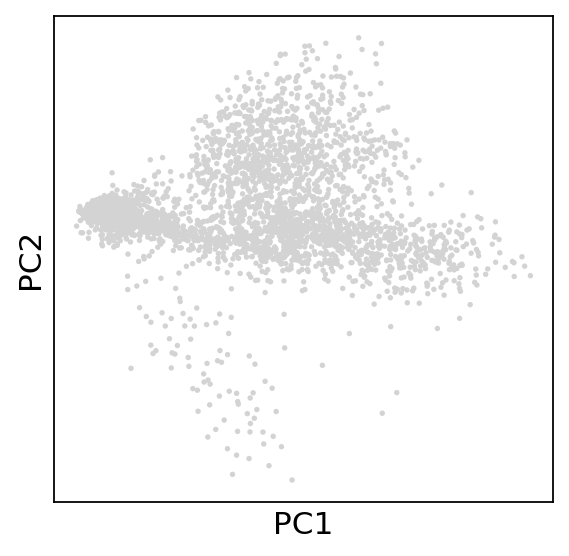

TX45 Prosalpha3


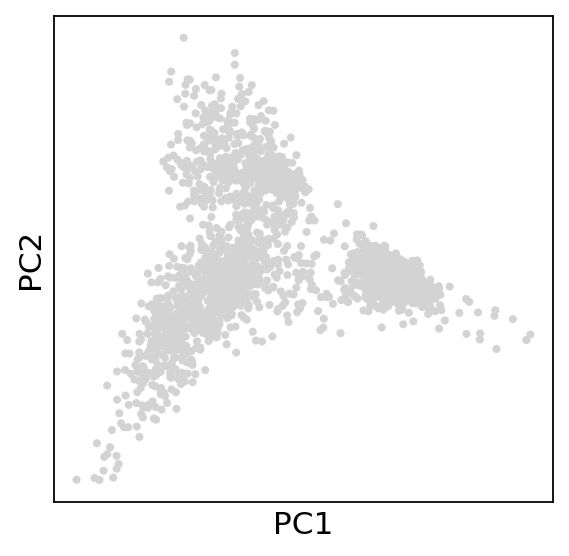

TX46 ctrl


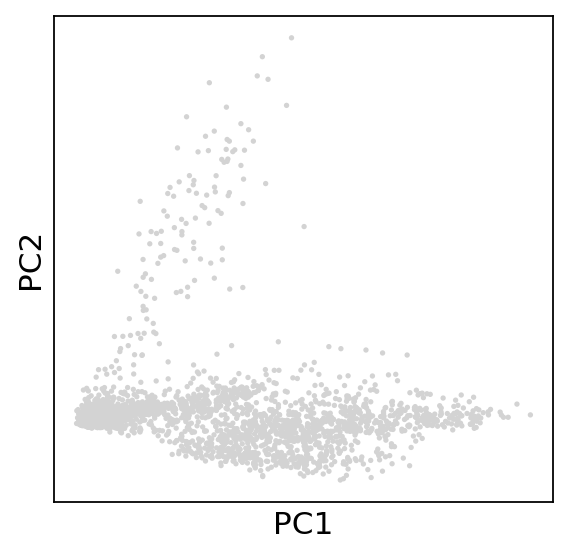

TX46 LamC


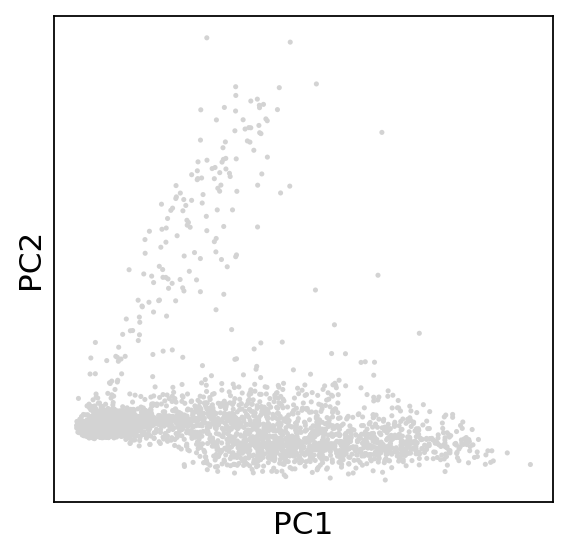

TX46 Prosalpha3


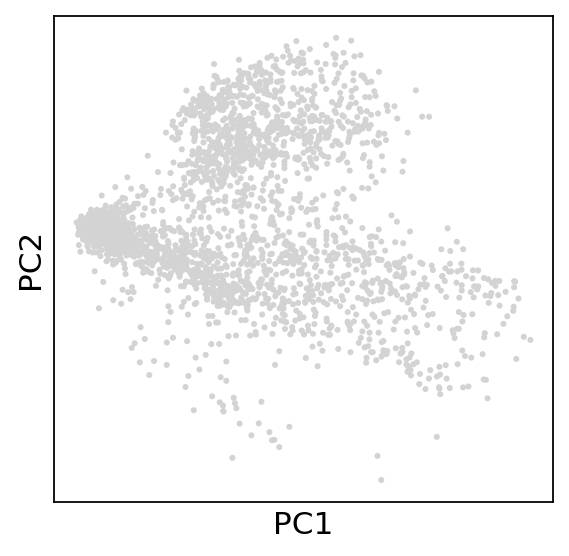

In [50]:
for adata, run_label in zip(sub_adatas, run_labels):
    print(run_label)
    sc.pl.pca(adata)

T


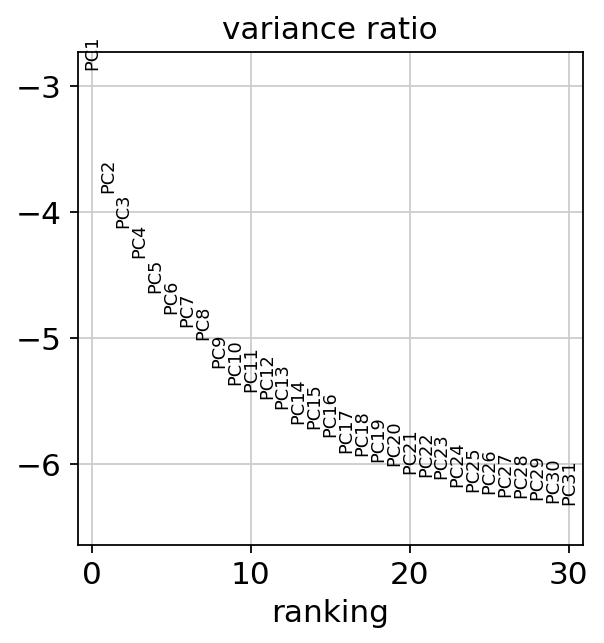

X


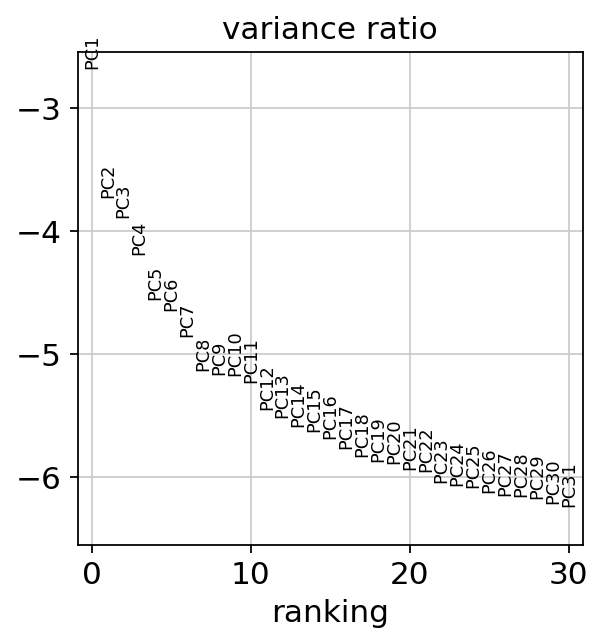

4


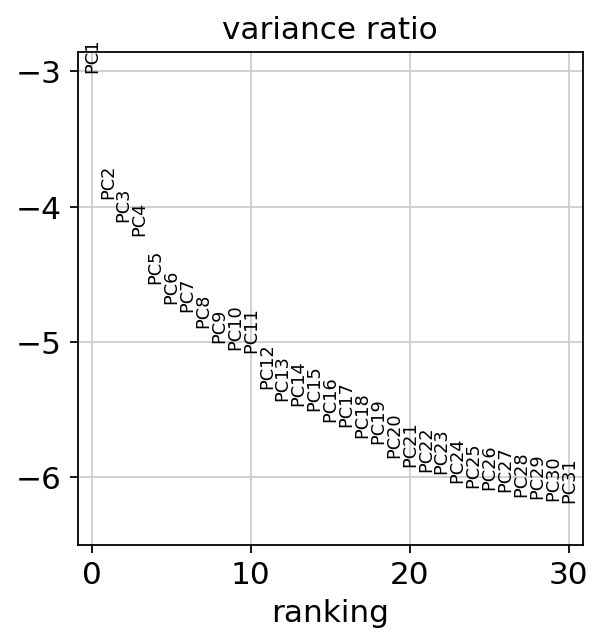

6


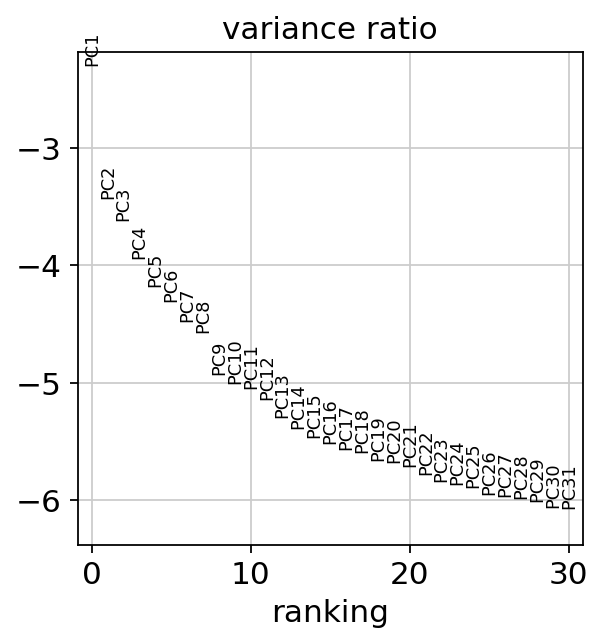

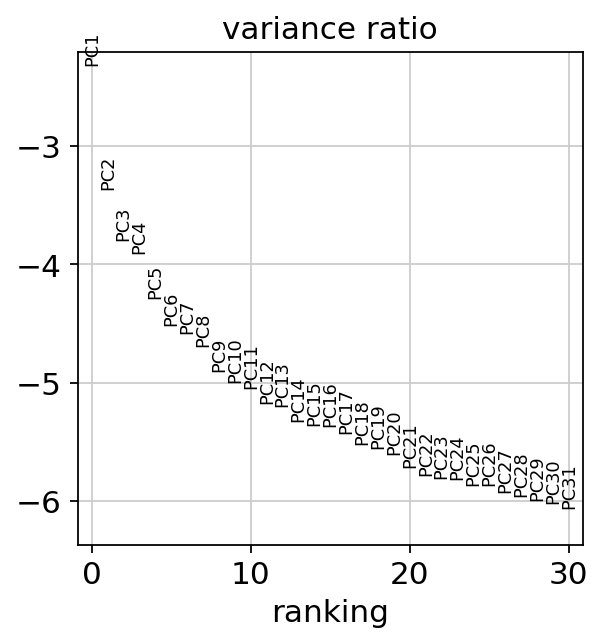

P


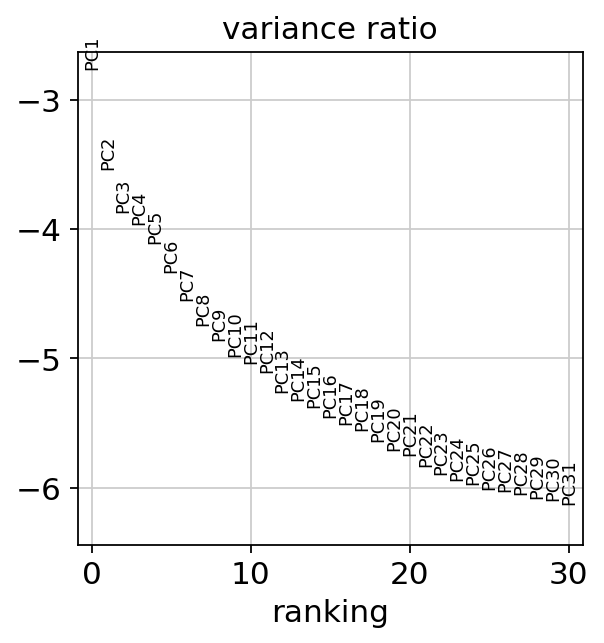

In [51]:
for adata, run_label in zip(sub_adatas, run_label):
    print(run_label)
    sc.pl.pca_variance_ratio(adata, log=True)

In [52]:
for adata, results_file in zip(sub_adatas, sub_results_files):
    adata.write(results_file)

In [53]:
adata

AnnData object with n_obs × n_vars = 4037 × 1397
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'sample', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [54]:
for adata in sub_adatas:
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, random_state=random_state)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbor

## Embedding the neighborhood graph

In [55]:
for adata in sub_adatas:
    sc.tl.umap(adata, random_state=random_state)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:06)


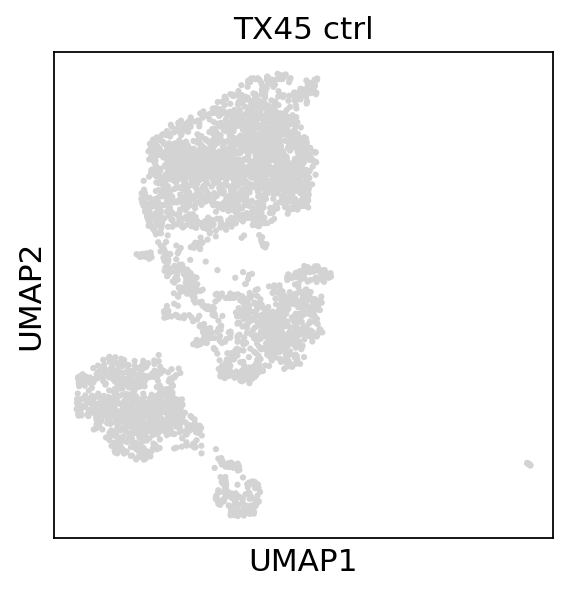

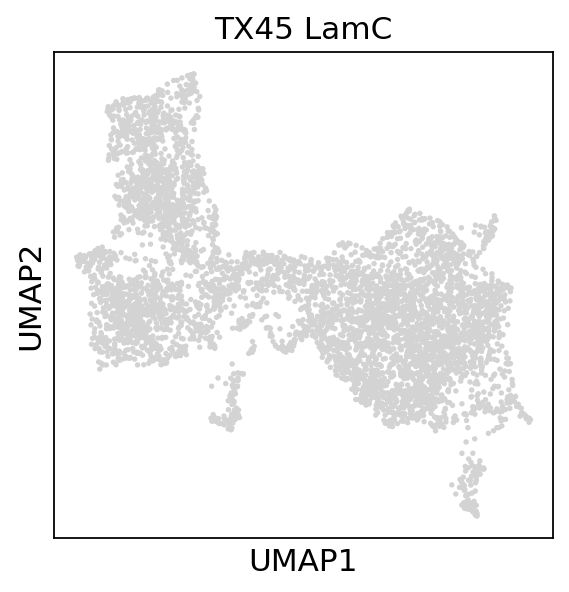

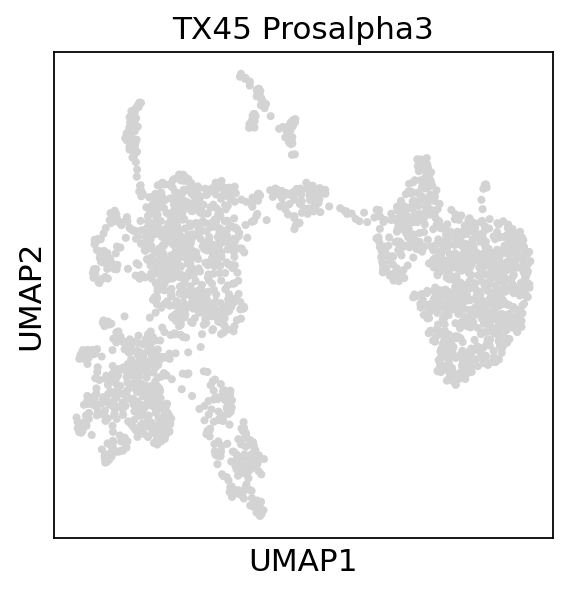

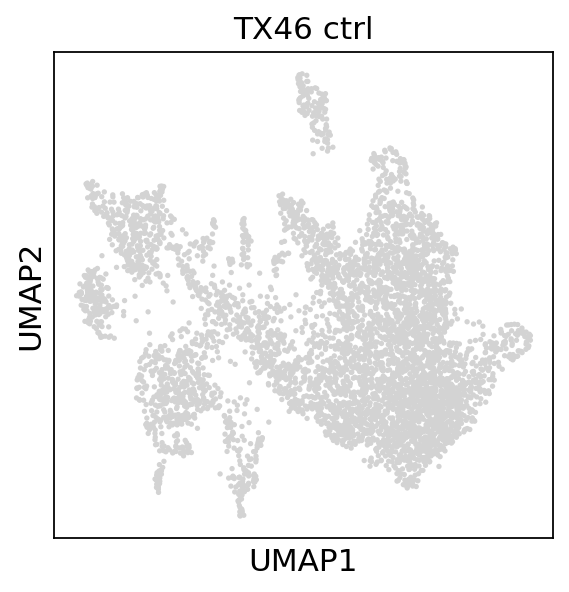

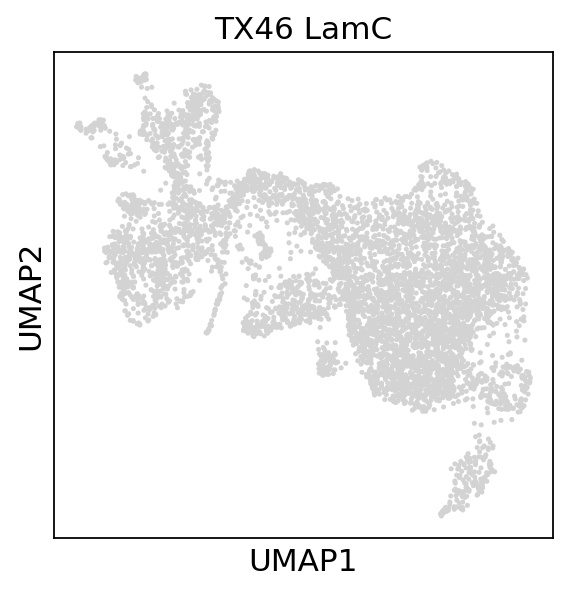

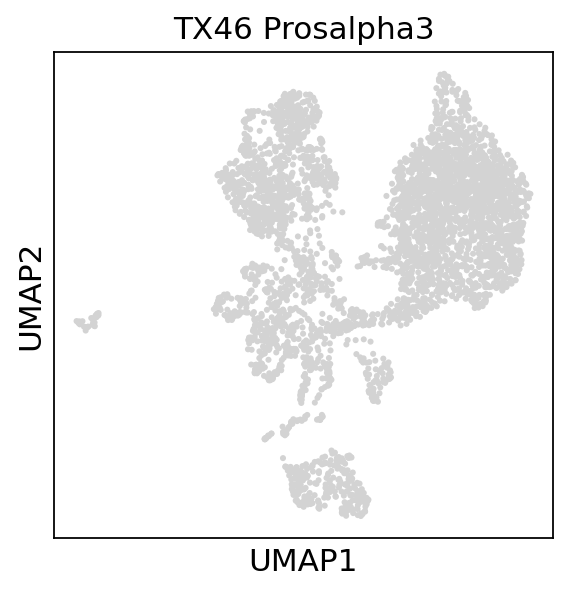

In [56]:
for adata in sub_adatas:
    sc.pl.umap(adata, title=adata.uns['sample'])

## Clustering the neighborhood graph

In [57]:
for adata in sub_adatas:
    sc.tl.leiden(adata, random_state=random_state, resolution=1)

running Leiden clustering


/scratch/jobs/60613130/ipykernel_2565628/719028579.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, random_state=random_state, resolution=1)


    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


Plot the clusters, which agree quite well with the result of Seurat.

TX45 ctrl


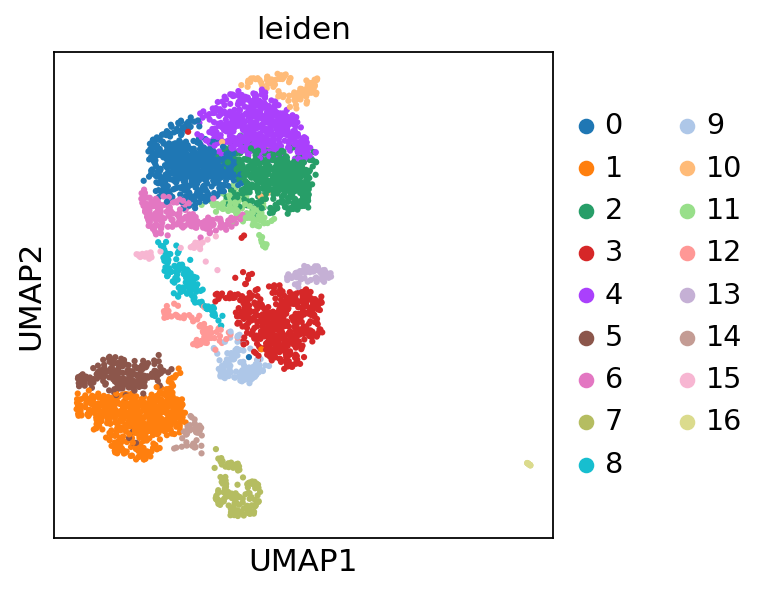

TX45 LamC


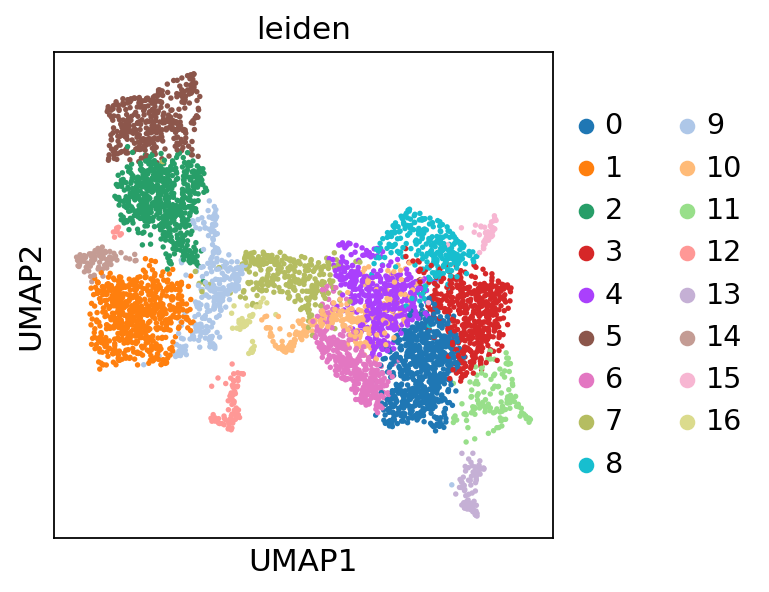

TX45 Prosalpha3


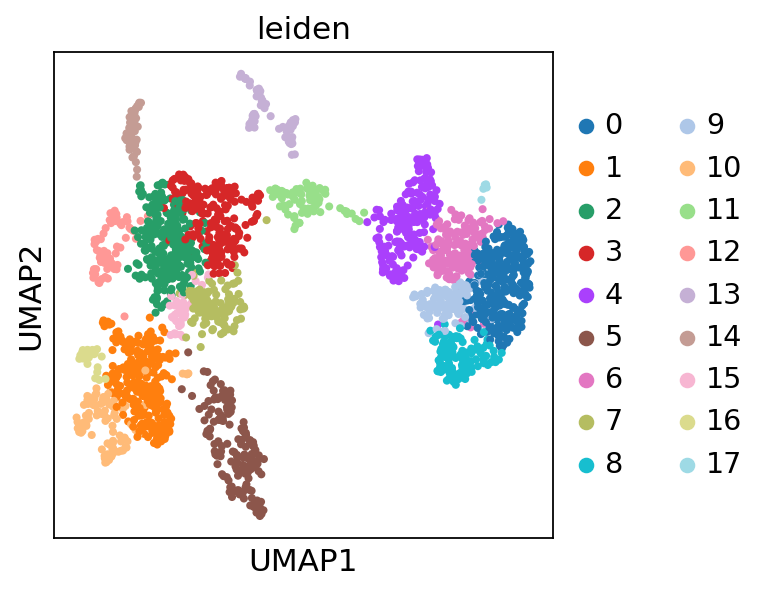

TX46 ctrl


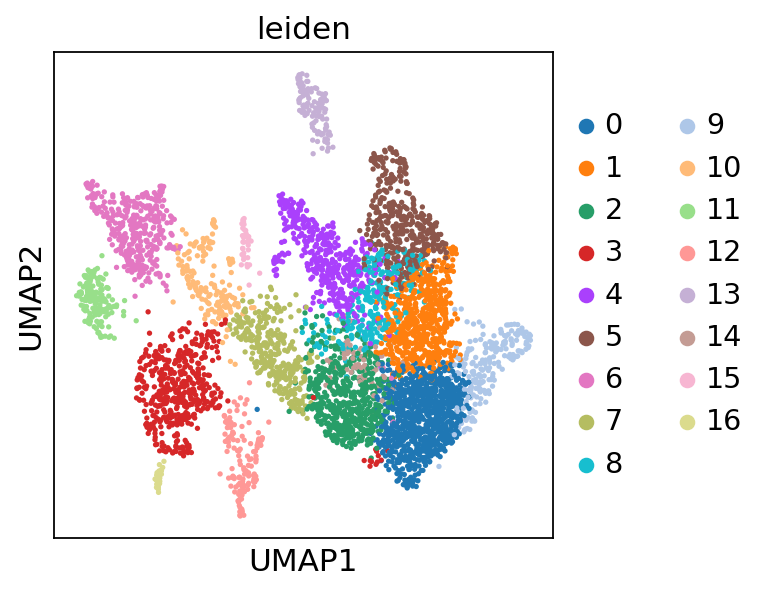

TX46 LamC


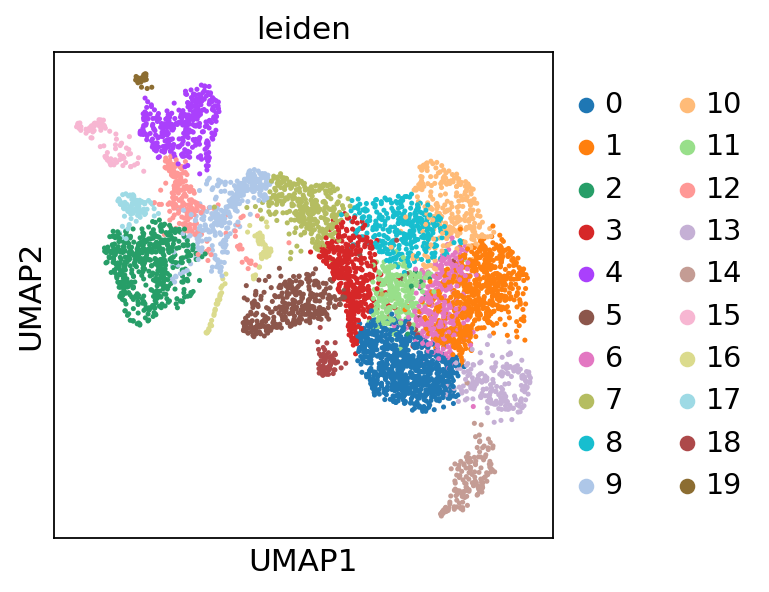

TX46 Prosalpha3


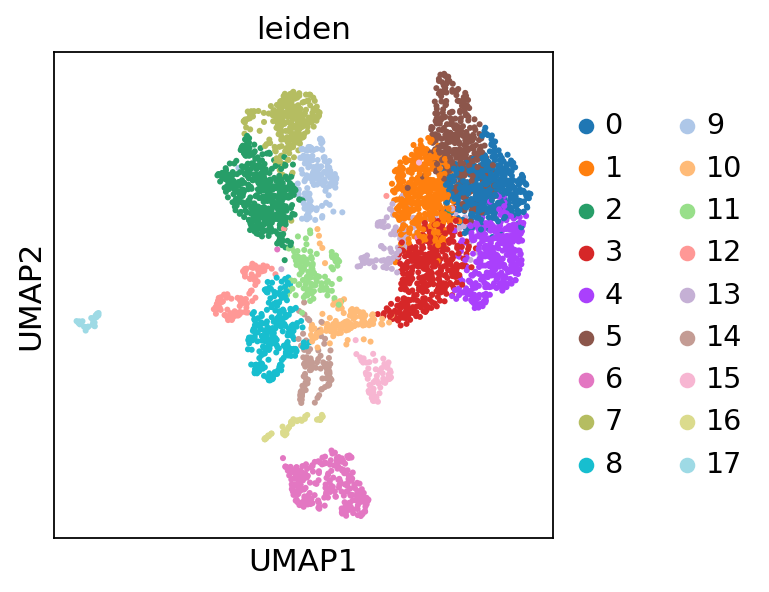

In [58]:
for adata, run_label in zip(sub_adatas, run_labels):
    print(run_label)
    sc.pl.umap(adata, color=['leiden'])

In [59]:
for adata, results_file in zip(sub_adatas, sub_results_files):
    adata.write(results_file)

# Combined adata

### Mutation helper function

In [60]:
ins_re = re.compile('^I(\d+)([ACGT]+)$')
def parse_mutation(mut):
    """
    Return struct of form 
       [mut_type, ref_pos_start, ref_pos_end, bases]
       
    Del has bases == None
    Ins and sub have same ref_pos_start and ref_pos_end
    Sub has tuple of ref and new bases
    """
    if mut.startswith('J'):
        if '>' not in mut:  # Standard splice location
            us_pos = mut.index('_')
            return ['splice', int(mut[1:us_pos]), int(mut[us_pos+1:]), None]
        arrow_pos = mut.index('>')
        pos_str, delta_str = mut[1:arrow_pos], mut[arrow_pos+1:]
        us_pos = pos_str.index('_')
        start, end = int(pos_str[:us_pos]), int(pos_str[us_pos+1:])
        if delta_str == '-':  # Splice missing
            return ['splice', start, end, 'missing']
        else:  # Splicing error
            us_pos = delta_str.index('_')
            return ['splice', start, end, (int(delta_str[:us_pos]), int(delta_str[us_pos+1:]))]
    elif mut.startswith('D'):
        dash_pos = mut.index('-')
        return ['del', int(mut[1:dash_pos]), int(mut[dash_pos+1:]), None]
    elif mut.startswith('I'):
        m = ins_re.match(mut)
        pos = int(m.group(1))
        return ['ins', pos, pos, m.group(2)]
    else:
        pos = int(mut[1:-1])
        return ['sub', pos, pos, (mut[0], mut[-1])]

### Add celltype and mutation information and combine

In [61]:
mutation_fpath_given_run_label = {}
for goi in gois:
    mutation_fpath_given_run_label[f'TX45 {goi}'] = f'../241023/results/TX45_{goi}_mutation_statuses.txt'
    mutation_fpath_given_run_label[f'TX46 {goi}'] = f'../250407/results/TX46_{goi}_mutation_statuses.txt'

In [62]:
uncalled_set = set(['n/a', 'low_cov_uncalled', 'high_cov_uncalled'])

In [63]:
mutation_signature_given_bc_given_run_label = {}
mutation_signature_with_uncalled_given_bc_given_run_label = {}
het_hom_status_given_bc_given_run_label = {}
het_hom_with_uncalled_status_given_bc_given_run_label = {}
combined_indel_lens_given_bc_given_run_label = {}
wtlike_status_given_bc_given_run_label = {}
mut_sig_cntr_given_run_label = {}
clone_id_given_bc_given_run_label = {}
cells_in_clone_given_bc_given_run_label = {}
clone_id_cntr_given_run_label = {}

for run_label in run_labels:
    if 'ctrl' in run_label:
        continue
    for d in [mutation_signature_given_bc_given_run_label, 
              mutation_signature_with_uncalled_given_bc_given_run_label,
              het_hom_status_given_bc_given_run_label,
              het_hom_with_uncalled_status_given_bc_given_run_label,
              combined_indel_lens_given_bc_given_run_label,
              wtlike_status_given_bc_given_run_label,
              clone_id_given_bc_given_run_label]:
        d[run_label] = {}
    for i, line in enumerate(open(mutation_fpath_given_run_label[run_label])):
        if i == 0:
            continue
        bc, maternal_mut, paternal_mut = line.strip().split()
        bc = f'{bc}-1'
        
        mat_pat_muts = [maternal_mut, paternal_mut]
        mat_pat_muts = ['uncalled' if mut in uncalled_set else mut for mut in mat_pat_muts]
        mut_str = '/'.join(mat_pat_muts)
        mutation_signature_with_uncalled_given_bc_given_run_label[run_label][bc] = mut_str
        
        if 'uncalled' in mat_pat_muts:
            het_hom_with_uncalled_status = 'uncalled'
        elif mat_pat_muts == ['wt', 'wt']:
            het_hom_with_uncalled_status = 'wt'
        elif 'wt' in mat_pat_muts:
            het_hom_with_uncalled_status = 'het'
        else:
            het_hom_with_uncalled_status = 'hom'
        het_hom_with_uncalled_status_given_bc_given_run_label[run_label][bc] = het_hom_with_uncalled_status
        
        if 'uncalled' in mat_pat_muts:
            continue
        mutation_signature_given_bc_given_run_label[run_label][bc] = mut_str

        if 'uncalled' in mat_pat_muts:
            het_hom_status = 'uncalled'
        elif mat_pat_muts == ['wt', 'wt']:
            het_hom_status = 'wt'
        elif 'wt' in mat_pat_muts:
            het_hom_status = 'het'
        else:
            het_hom_status = 'hom'
        het_hom_status_given_bc_given_run_label[run_label][bc] = het_hom_status

        indel_lens = []
        for mut_str in mat_pat_muts:
            indel_len = 0
            for mut in mut_str.split(','):
                if mut in ['wt', 'uncalled']:
                    continue
                mut_type, start, end, bases = parse_mutation(mut)
                if mut_type == 'del':
                    mut_len = end - start + 1
                    indel_len -= mut_len
                if mut_type == 'ins':
                    mut_len = len(bases)
                    indel_len += mut_len
            indel_lens.append(indel_len)
        indel_lens = tuple(indel_lens)
        combined_indel_lens_given_bc_given_run_label[run_label][bc] = indel_lens

        indel_mod3_lens = [il % 3 if il <= 30 else -1 for il in indel_lens]
        if 'uncalled' in mat_pat_muts:
            wtlike_status = 'uncalled'
        elif mat_pat_muts == ['wt', 'wt']:
            wtlike_status = 'wt'
        elif indel_mod3_lens == [0, 0]:
            wtlike_status = 'wt-like'
        elif 'wt' in mat_pat_muts:
            wtlike_status = 'het'
        elif 0 in indel_mod3_lens:
            wtlike_status = 'het-like'
        else:
            assert len(indel_mod3_lens) == 2, indel_mod3_lens
            wtlike_status = 'hom'
        wtlike_status_given_bc_given_run_label[run_label][bc] = wtlike_status

    mut_sig_cntr = Counter(mutation_signature_given_bc_given_run_label[run_label].values())
    mut_sig_cntr_given_run_label[run_label] = mut_sig_cntr
    clones = set([mut_sig for mut_sig in mut_sig_cntr.keys() if 'uncalled' not in mut_sig and mut_sig != 'wt/wt'])
    clone_id_given_bc_given_run_label[run_label] = {}
    cells_in_clone_given_bc_given_run_label[run_label] = {}
    for bc, mut_sig in mutation_signature_given_bc_given_run_label[run_label].items():
        if mut_sig in clones:
            clone_id_given_bc_given_run_label[run_label][bc] = f'{run_label} {mut_sig}'
            cells_in_clone_given_bc_given_run_label[run_label][bc] = mut_sig_cntr[mut_sig]
        else:
            clone_id_given_bc_given_run_label[run_label][bc] = ''
            cells_in_clone_given_bc_given_run_label[run_label][bc] = 0
    clone_id_cntr_given_run_label[run_label] = Counter(clone_id_given_bc_given_run_label[run_label].values())

In [64]:
tmps = []
use_labels = run_labels 
for label in use_labels:
    assert label in run_labels, label
for adata, run_label in zip(sub_adatas, run_labels):
    if run_label not in use_labels:
        continue
    tmp = adata.copy()
    tmp = tmp.raw.to_adata()
    tmp.obs['batch'] = run_label
    tmp.uns = {'log1p': tmp.uns['log1p']}
    
    if 'ctrl' in run_label:
        tmp.obs['mut_sig'] = ''
        tmp.obs['het_hom_status'] = 'wt'
        tmp.obs['het_hom_with_uncalled_status'] = 'wt'
        tmp.obs['indel_lens'] = [(0, 0) for _ in tmp.obs.index]
        tmp.obs['maternal_indel_len'] = 0
        tmp.obs['paternal_indel_len'] = 0
        tmp.obs['wtlike_status'] = 'wt'
        tmp.obs['clone_id'] = ''
        tmp.obs['clone_cell_ct'] = 0
    else:
        mut_sig_with_uncalled, het_hom_with_uncalled_status = [], []
        mut_sig, het_hom_status, indel_lens, wtlike_status, clone_id, clone_cell_ct = [], [], [], [], [], []
        for bc in tmp.obs.index:
            try:
                mut_sig_with_uncalled.append(mutation_signature_with_uncalled_given_bc_given_run_label[run_label][bc])
                het_hom_with_uncalled_status.append(het_hom_with_uncalled_status_given_bc_given_run_label[run_label][bc])
            except:
                mut_sig_with_uncalled.append('')
                het_hom_with_uncalled_status.append('')
            try:
                mut_sig.append(mutation_signature_given_bc_given_run_label[run_label][bc])
                het_hom_status.append(het_hom_status_given_bc_given_run_label[run_label][bc])
                indel_lens.append(combined_indel_lens_given_bc_given_run_label[run_label][bc])
                wtlike_status.append(wtlike_status_given_bc_given_run_label[run_label][bc])
                clone_id.append(clone_id_given_bc_given_run_label[run_label][bc])
                clone_cell_ct.append(cells_in_clone_given_bc_given_run_label[run_label][bc])
            except:
                mut_sig.append('')
                het_hom_status.append('')
                indel_lens.append((None, None))
                wtlike_status.append('')
                clone_id.append('')
                clone_cell_ct.append(0)
        tmp.obs['mut_sig_with_uncalled'] = mut_sig_with_uncalled
        tmp.obs['het_hom_with_uncalled_status'] = het_hom_with_uncalled_status
        tmp.obs['mut_sig'] = mut_sig
        tmp.obs['het_hom_status'] = het_hom_status
        tmp.obs['indel_lens'] = indel_lens
        tmp.obs['maternal_indel_len'] = [tup[0] for tup in indel_lens]
        tmp.obs['paternal_indel_len'] = [tup[1] for tup in indel_lens]
        tmp.obs['wtlike_status'] = wtlike_status
        tmp.obs['clone_id'] = clone_id
        tmp.obs['clone_cell_ct'] = clone_cell_ct      
    
    tmps.append(tmp)

In [65]:
comb_adata = tmps[0].concatenate(*tmps[1:], **dict(join='outer', batch_categories=[rl for rl in run_labels if rl in use_labels]))

/scratch/jobs/60613130/ipykernel_2565628/1259043713.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  comb_adata = tmps[0].concatenate(*tmps[1:], **dict(join='outer', batch_categories=[rl for rl in run_labels if rl in use_labels]))


In [66]:
comb_adata

AnnData object with n_obs × n_vars = 26068 × 9928
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'batch', 'mut_sig', 'het_hom_status', 'het_hom_with_uncalled_status', 'indel_lens', 'maternal_indel_len', 'paternal_indel_len', 'wtlike_status', 'clone_id', 'clone_cell_ct', 'mut_sig_with_uncalled'
    var: 'gene_ids-TX45 LamC', 'feature_types-TX45 LamC', 'mt-TX45 LamC', 'n_cells_by_counts-TX45 LamC', 'mean_counts-TX45 LamC', 'pct_dropout_by_counts-TX45 LamC', 'total_counts-TX45 LamC', 'n_cells-TX45 LamC', 'highly_variable-TX45 LamC', 'means-TX45 LamC', 'dispersions-TX45 LamC', 'dispersions_norm-TX45 LamC', 'gene_ids-TX45 Prosalpha3', 'feature_types-TX45 Prosalpha3', 'mt-TX45 Prosalpha3', 'n_cells_by_counts-TX45 Prosalpha3', 'mean_counts-TX45 Prosalpha3', 'pct_dropout_by_counts-TX45 Prosalpha3', 'total_counts-TX45 Prosalpha3', 'n_cells-TX45 Prosalpha3', 'highly_variable-TX45 Prosalpha3', 'means-TX45 Prosalpha3', 'dispersions-TX45 Prosa

In [67]:
comb_adata.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,leiden,batch,mut_sig,het_hom_status,het_hom_with_uncalled_status,indel_lens,maternal_indel_len,paternal_indel_len,wtlike_status,clone_id,clone_cell_ct,mut_sig_with_uncalled
AAACCTGAGCGATATA-1-TX45 ctrl,738,2822.0,184.0,6.520198,738,0,TX45 ctrl,,wt,wt,"(0, 0)",0.0,0.0,wt,,0,NaN
AAACCTGAGCTTCGCG-1-TX45 ctrl,1595,7457.0,353.0,4.733807,1595,9,TX45 ctrl,,wt,wt,"(0, 0)",0.0,0.0,wt,,0,NaN
AAACCTGAGGCATGGT-1-TX45 ctrl,695,1656.0,84.0,5.072464,695,12,TX45 ctrl,,wt,wt,"(0, 0)",0.0,0.0,wt,,0,NaN
AAACCTGCAAACGTGG-1-TX45 ctrl,1754,15065.0,1508.0,10.009957,1754,2,TX45 ctrl,,wt,wt,"(0, 0)",0.0,0.0,wt,,0,NaN
AAACCTGGTCACAAGG-1-TX45 ctrl,2026,14876.0,1889.0,12.698306,2026,4,TX45 ctrl,,wt,wt,"(0, 0)",0.0,0.0,wt,,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGTGTCCAT-1-TX46 Prosalpha3,467,1096.0,67.0,6.113139,467,0,TX46 Prosalpha3,,,,"(None, None)",NaN,NaN,,,0,
TTTGTCACAGACGCAA-1-TX46 Prosalpha3,1254,4129.0,140.0,3.390651,1254,5,TX46 Prosalpha3,"D20994978-20994987,D20995488-20995565/D2099497...",hom,hom,"(-88, -13)",-88.0,-13.0,hom,"TX46 Prosalpha3 D20994978-20994987,D20995488-2...",8,"D20994978-20994987,D20995488-20995565/D2099497..."
TTTGTCAGTCAATGTC-1-TX46 Prosalpha3,1845,8991.0,242.0,2.691581,1845,1,TX46 Prosalpha3,wt/wt,wt,wt,"(0, 0)",0.0,0.0,wt,,0,wt/wt
TTTGTCATCCGCTGTT-1-TX46 Prosalpha3,1162,4543.0,136.0,2.993617,1162,0,TX46 Prosalpha3,,,uncalled,"(None, None)",NaN,NaN,,,0,uncalled/wt


In [68]:
comb_adata.var

,gene_ids-TX45 LamC,feature_types-TX45 LamC,mt-TX45 LamC,n_cells_by_counts-TX45 LamC,mean_counts-TX45 LamC,pct_dropout_by_counts-TX45 LamC,total_counts-TX45 LamC,n_cells-TX45 LamC,highly_variable-TX45 LamC,means-TX45 LamC,...,mt-TX46 ctrl,n_cells_by_counts-TX46 ctrl,mean_counts-TX46 ctrl,pct_dropout_by_counts-TX46 ctrl,total_counts-TX46 ctrl,n_cells-TX46 ctrl,highly_variable-TX46 ctrl,means-TX46 ctrl,dispersions-TX46 ctrl,dispersions_norm-TX46 ctrl
128up,FBgn0010339,Gene Expression,False,964.0,0.207063,85.003111,1331.0,964.0,False,0.360313,...,False,1369.0,0.311107,77.736217,1913.0,1368.0,False,0.461107,1.114570,-0.719661
14-3-3epsilon,FBgn0020238,Gene Expression,False,5157.0,7.591164,19.772869,48796.0,5146.0,False,2.844267,...,False,5338.0,8.596845,13.189136,52862.0,5324.0,False,2.934211,2.014998,-0.970911
14-3-3zeta,FBgn0004907,Gene Expression,False,5245.0,5.945084,18.403858,38215.0,5230.0,False,2.610821,...,False,5291.0,5.712473,13.953488,35126.0,5274.0,False,2.511408,1.500721,-1.171204
140up,FBgn0010340,Gene Expression,False,467.0,0.081674,92.734910,525.0,467.0,False,0.145386,...,False,466.0,0.085380,92.421532,525.0,466.0,False,0.138939,1.071010,-0.577329
18w,FBgn0004364,Gene Expression,False,73.0,0.011512,98.864343,74.0,73.0,False,0.028743,...,False,79.0,0.015287,98.715238,94.0,79.0,True,0.044736,1.792085,0.744158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zfh2,FBgn0004607,Gene Expression,False,488.0,0.091319,92.408214,587.0,487.0,True,0.277017,...,False,727.0,0.142300,88.176939,875.0,727.0,False,0.355487,1.622132,0.404145
zip,FBgn0265434,Gene Expression,False,3909.0,3.198507,39.187928,20560.0,3907.0,False,2.059843,...,False,4623.0,4.136445,24.817043,25435.0,4621.0,False,2.305089,2.028929,-0.408441
zormin,FBgn0052311,Gene Expression,False,5.0,0.000778,99.922215,5.0,5.0,False,0.004350,...,False,5.0,0.000813,99.918686,5.0,5.0,False,0.001706,0.585540,-1.467033
zuc,FBgn0261266,Gene Expression,False,49.0,0.007778,99.237710,50.0,49.0,False,0.023779,...,False,92.0,0.015124,98.503822,93.0,92.0,False,0.039049,1.289986,-0.176020


### Pre-batch correction manipulation

In [69]:
sc.pp.highly_variable_genes(comb_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


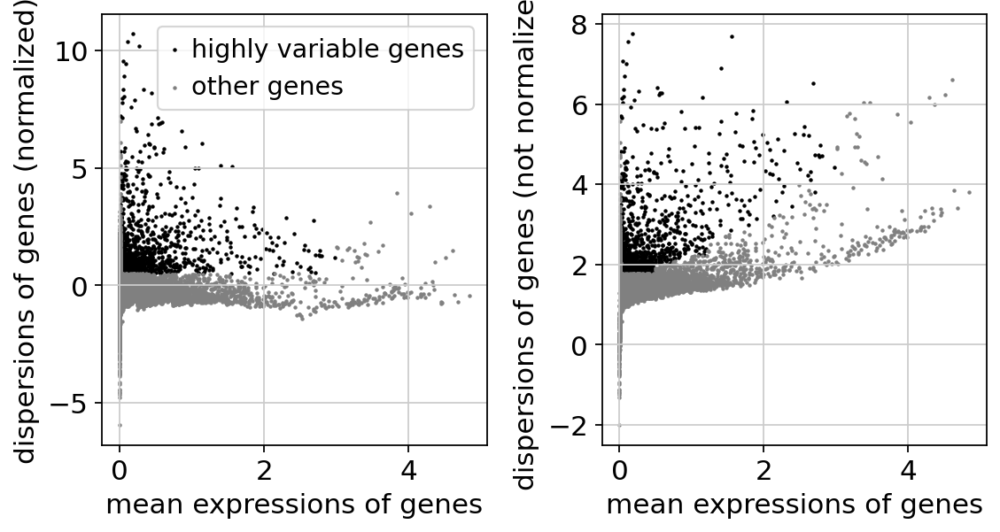

In [70]:
sc.pl.highly_variable_genes(comb_adata)

In [71]:
comb_adata.raw = comb_adata

In [72]:
comb_adata = comb_adata[:, comb_adata.var['highly_variable']]

In [73]:
comb_adata

View of AnnData object with n_obs × n_vars = 26068 × 1175
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'batch', 'mut_sig', 'het_hom_status', 'het_hom_with_uncalled_status', 'indel_lens', 'maternal_indel_len', 'paternal_indel_len', 'wtlike_status', 'clone_id', 'clone_cell_ct', 'mut_sig_with_uncalled'
    var: 'gene_ids-TX45 LamC', 'feature_types-TX45 LamC', 'mt-TX45 LamC', 'n_cells_by_counts-TX45 LamC', 'mean_counts-TX45 LamC', 'pct_dropout_by_counts-TX45 LamC', 'total_counts-TX45 LamC', 'n_cells-TX45 LamC', 'highly_variable-TX45 LamC', 'means-TX45 LamC', 'dispersions-TX45 LamC', 'dispersions_norm-TX45 LamC', 'gene_ids-TX45 Prosalpha3', 'feature_types-TX45 Prosalpha3', 'mt-TX45 Prosalpha3', 'n_cells_by_counts-TX45 Prosalpha3', 'mean_counts-TX45 Prosalpha3', 'pct_dropout_by_counts-TX45 Prosalpha3', 'total_counts-TX45 Prosalpha3', 'n_cells-TX45 Prosalpha3', 'highly_variable-TX45 Prosalpha3', 'means-TX45 Prosalpha3', 'dispersions-TX

In [74]:
sc.pp.scale(comb_adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


## Batch correction

In [75]:
resorted_run_labels = sorted(run_labels, key=lambda label: (label.split()[-1], label.split()[0]), reverse=True)
tmps = []
for run_label in resorted_run_labels:
    print(run_label)
    tmp = comb_adata[comb_adata.obs['batch'] == run_label]
    tmp = tmp.copy()
    tmps.append(tmp)

TX46 ctrl
TX45 ctrl
TX46 Prosalpha3
TX45 Prosalpha3
TX46 LamC
TX45 LamC


In [76]:
bc_adata, mnn_list, angle_list = sc.external.pp.mnn_correct(*tmps)

/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py:30: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float32, 1, 'A', False, aligned=True), Array(float32, 1, 'A', False, aligned=True))
  dist[i, j] = np.dot(m[i], n[j])
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py:205: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float32, 1, 'C', False, aligned=True), Array(float32, 1, 'A', False, aligned=True))
  scale = np.dot(working, grad)
/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py:215: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float32, 1, 'C', False, aligned=True), Array(float32, 1, 'A', False, aligned=True))
  curproj = np.dot(grad, curcell)


Performing cosine normalization...
Starting MNN correct iteration. Reference batch: 0
Step 1 of 5: processing batch 1
  Looking for MNNs...


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py:90: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "find_mutual_nn" failed type inference due to: non-precise type pyobject
During: typing of argument at /home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py (96)

File "../../../../../../home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py", line 96:
def find_mutual_nn(data1, data2, k1, k2, n_jobs):
    <source elided>
    mutual_2 = []
    for index_2 in range(data2.shape[0]):
    ^

  @jit((float32[:, :], float32[:, :], int8, int8, int8), forceobj=True)


  Computing correction vectors...


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py:105: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "compute_correction" failed type inference due to: non-precise type pyobject
During: typing of argument at /home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py (110)

File "../../../../../../home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/utils.py", line 110:
def compute_correction(data1, data2, mnn1, mnn2, data2_or_raw2, sigma):
    <source elided>
    vect_reduced = np.zeros((data2.shape[0], vect.shape[1]), dtype=np.float32)
    for index, ve in zip(mnn2, vect):
    ^

  @jit(float32[:, :](float32[:, :], float32[:, :], int32[:], int32[:], float32[:, :], float32), forceobj=True)


  Adjusting variance...
  Applying correction...
Step 2 of 5: processing batch 2
  Looking for MNNs...
  Computing correction vectors...
  Adjusting variance...
  Applying correction...
Step 3 of 5: processing batch 3
  Looking for MNNs...
  Computing correction vectors...
  Adjusting variance...
  Applying correction...
Step 4 of 5: processing batch 4
  Looking for MNNs...
  Computing correction vectors...
  Adjusting variance...
  Applying correction...
Step 5 of 5: processing batch 5
  Looking for MNNs...
  Computing correction vectors...
  Adjusting variance...
  Applying correction...
MNN correction complete. Gathering output...
Packing AnnData object...
Done.


/home/hawkins/venvs/envsinglecell/lib/python3.11/site-packages/mnnpy/mnn.py:129: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = AnnData.concatenate(*datas, batch_key=batch_key,


In [77]:
bc_adata

AnnData object with n_obs × n_vars = 26068 × 1175
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'batch', 'mut_sig', 'het_hom_status', 'het_hom_with_uncalled_status', 'indel_lens', 'maternal_indel_len', 'paternal_indel_len', 'wtlike_status', 'clone_id', 'clone_cell_ct', 'mut_sig_with_uncalled'
    var: 'gene_ids-TX45 LamC', 'feature_types-TX45 LamC', 'mt-TX45 LamC', 'n_cells_by_counts-TX45 LamC', 'mean_counts-TX45 LamC', 'pct_dropout_by_counts-TX45 LamC', 'total_counts-TX45 LamC', 'n_cells-TX45 LamC', 'highly_variable-TX45 LamC', 'means-TX45 LamC', 'dispersions-TX45 LamC', 'dispersions_norm-TX45 LamC', 'gene_ids-TX45 Prosalpha3', 'feature_types-TX45 Prosalpha3', 'mt-TX45 Prosalpha3', 'n_cells_by_counts-TX45 Prosalpha3', 'mean_counts-TX45 Prosalpha3', 'pct_dropout_by_counts-TX45 Prosalpha3', 'total_counts-TX45 Prosalpha3', 'n_cells-TX45 Prosalpha3', 'highly_variable-TX45 Prosalpha3', 'means-TX45 Prosalpha3', 'dispersions-TX45 Prosa

In [78]:
mnn_list

[0,
        new cell  ref cell  original batch
 0             0      3844               0
 1             0      4898               0
 2             0      2905               0
 3             0      4845               0
 4             0      4652               0
 ...         ...       ...             ...
 22273      3822      2235               0
 22274      3822      1107               0
 22275      3822      5192               0
 22276      3822       553               0
 22277      3822      4756               0
 
 [22278 rows x 3 columns],
        new cell  ref cell  original batch
 0             0      5229               1
 1             0      1629               0
 2             0      7140               1
 3             0      6700               1
 4             0      5488               1
 ...         ...       ...             ...
 32142      4036      5657               1
 32143      4036      5550               1
 32144      4036      6544               1
 32145      4036     

In [79]:
bc_adata.obs['batch']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    0
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    0
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    0
AAACCTGGTCAATGTC-1-TX46 ctrl-0    0
AAACCTGGTCCATCCT-1-TX46 ctrl-0    0
                                 ..
TTTGTCACAGAAGCAC-1-TX45 LamC-5    5
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    5
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    5
TTTGTCATCGCCAAAT-1-TX45 LamC-5    5
TTTGTCATCTGGAGCC-1-TX45 LamC-5    5
Name: batch, Length: 26068, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [80]:
for i in range(len(run_labels)):
    print(bc_adata[bc_adata.obs['batch'] == str(i)].obs['batch'][:2])

AAACCTGAGAAACGCC-1-TX46 ctrl-0    0
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    0
Name: batch, dtype: category
Categories (1, object): ['0']
AAACCTGAGCGATATA-1-TX45 ctrl-1    1
AAACCTGAGCTTCGCG-1-TX45 ctrl-1    1
Name: batch, dtype: category
Categories (1, object): ['1']
AAACCTGAGCAGGCTA-1-TX46 Prosalpha3-2    2
AAACCTGAGCGCTTAT-1-TX46 Prosalpha3-2    2
Name: batch, dtype: category
Categories (1, object): ['2']
AAACCTGAGCCAACAG-1-TX45 Prosalpha3-3    3
AAACCTGAGCGCTCCA-1-TX45 Prosalpha3-3    3
Name: batch, dtype: category
Categories (1, object): ['3']
AAACCTGAGCGTTGCC-1-TX46 LamC-4    4
AAACCTGCAGATTGCT-1-TX46 LamC-4    4
Name: batch, dtype: category
Categories (1, object): ['4']
AAACCTGAGAGGGATA-1-TX45 LamC-5    5
AAACCTGAGTTACGGG-1-TX45 LamC-5    5
Name: batch, dtype: category
Categories (1, object): ['5']


In [81]:
bc_adata.obs['batch_idx'] = bc_adata.obs['batch']
bc_adata.obs['batch_idx']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    0
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    0
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    0
AAACCTGGTCAATGTC-1-TX46 ctrl-0    0
AAACCTGGTCCATCCT-1-TX46 ctrl-0    0
                                 ..
TTTGTCACAGAAGCAC-1-TX45 LamC-5    5
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    5
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    5
TTTGTCATCGCCAAAT-1-TX45 LamC-5    5
TTTGTCATCTGGAGCC-1-TX45 LamC-5    5
Name: batch_idx, Length: 26068, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [82]:
bc_adata.obs['batch'] = [resorted_run_labels[int(s)] for s in bc_adata.obs['batch_idx']]
bc_adata.obs['batch']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    TX46 ctrl
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    TX46 ctrl
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    TX46 ctrl
AAACCTGGTCAATGTC-1-TX46 ctrl-0    TX46 ctrl
AAACCTGGTCCATCCT-1-TX46 ctrl-0    TX46 ctrl
                                    ...    
TTTGTCACAGAAGCAC-1-TX45 LamC-5    TX45 LamC
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    TX45 LamC
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    TX45 LamC
TTTGTCATCGCCAAAT-1-TX45 LamC-5    TX45 LamC
TTTGTCATCTGGAGCC-1-TX45 LamC-5    TX45 LamC
Name: batch, Length: 26068, dtype: object

In [83]:
bc_adata.obs['rep'] = [resorted_run_labels[int(s)].split()[0] for s in bc_adata.obs['batch_idx']]
bc_adata.uns['rep_colors'] = sc.pl.palettes.vega_10
bc_adata.obs['rep']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    TX46
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    TX46
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    TX46
AAACCTGGTCAATGTC-1-TX46 ctrl-0    TX46
AAACCTGGTCCATCCT-1-TX46 ctrl-0    TX46
                                  ... 
TTTGTCACAGAAGCAC-1-TX45 LamC-5    TX45
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    TX45
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    TX45
TTTGTCATCGCCAAAT-1-TX45 LamC-5    TX45
TTTGTCATCTGGAGCC-1-TX45 LamC-5    TX45
Name: rep, Length: 26068, dtype: object

In [84]:
bc_adata.obs['perturbation'] = [resorted_run_labels[int(s)].split()[1] for s in bc_adata.obs['batch_idx']]
bc_adata.uns['perturbation_colors'] = sc.pl.palettes.vega_10
bc_adata.obs['perturbation']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    ctrl
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    ctrl
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    ctrl
AAACCTGGTCAATGTC-1-TX46 ctrl-0    ctrl
AAACCTGGTCCATCCT-1-TX46 ctrl-0    ctrl
                                  ... 
TTTGTCACAGAAGCAC-1-TX45 LamC-5    LamC
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    LamC
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    LamC
TTTGTCATCGCCAAAT-1-TX45 LamC-5    LamC
TTTGTCATCTGGAGCC-1-TX45 LamC-5    LamC
Name: perturbation, Length: 26068, dtype: object

In [85]:
bc_adata.obs['batch_idx']

AAACCTGAGAAACGCC-1-TX46 ctrl-0    0
AAACCTGAGCTGCAAG-1-TX46 ctrl-0    0
AAACCTGCAAGCCCAC-1-TX46 ctrl-0    0
AAACCTGGTCAATGTC-1-TX46 ctrl-0    0
AAACCTGGTCCATCCT-1-TX46 ctrl-0    0
                                 ..
TTTGTCACAGAAGCAC-1-TX45 LamC-5    5
TTTGTCAGTTAAAGAC-1-TX45 LamC-5    5
TTTGTCAGTTTCGCTC-1-TX45 LamC-5    5
TTTGTCATCGCCAAAT-1-TX45 LamC-5    5
TTTGTCATCTGGAGCC-1-TX45 LamC-5    5
Name: batch_idx, Length: 26068, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [86]:
len(bc_adata.obs['batch_idx'])

26068

## Principal component analysis

In [87]:
sc.tl.pca(bc_adata, svd_solver='arpack', random_state=random_state)

computing PCA
    with n_comps=50
    finished (0:00:01)


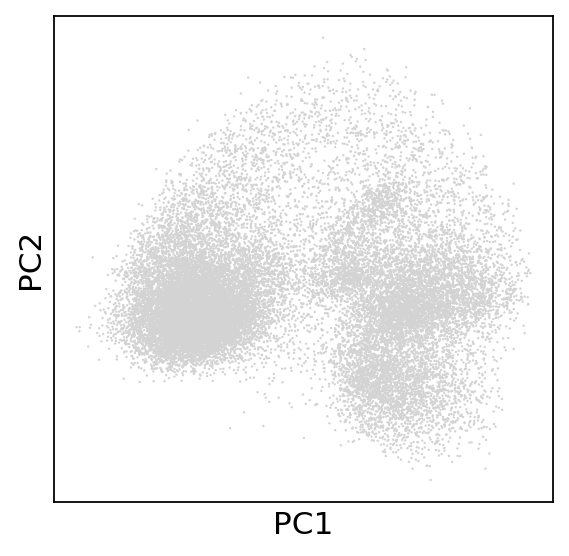

In [88]:
sc.pl.pca(bc_adata)

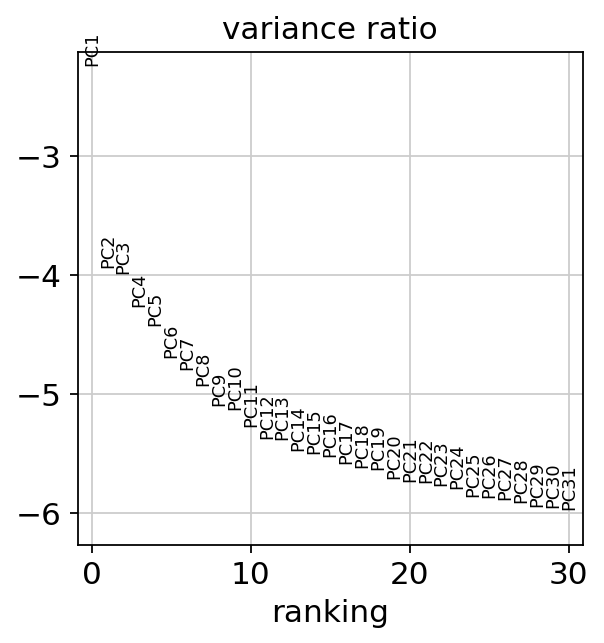

In [89]:
sc.pl.pca_variance_ratio(bc_adata, log=True)

## Computing the neighborhood graph

In [90]:
sc.pp.neighbors(bc_adata, n_neighbors=10, n_pcs=40, random_state=random_state)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)


## Embedding the neighborhood graph

In [91]:
sc.tl.umap(bc_adata, random_state=random_state)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:15)


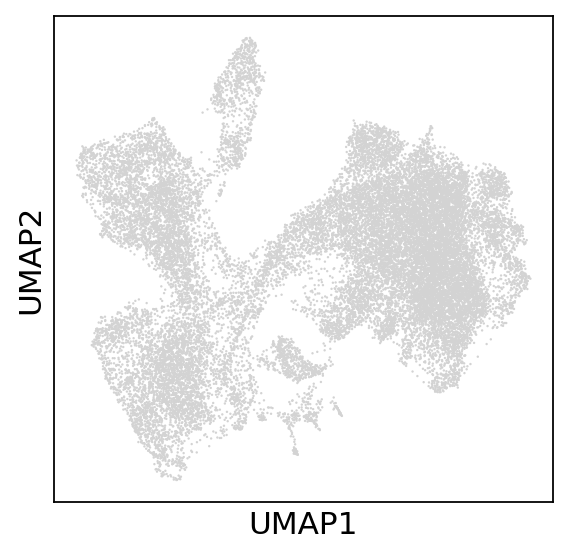

In [92]:
sc.pl.umap(bc_adata)

## Clustering the neighborhood graph

In [93]:
sc.tl.leiden(bc_adata, random_state=random_state, resolution=2)

running Leiden clustering
    finished: found 40 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:14)


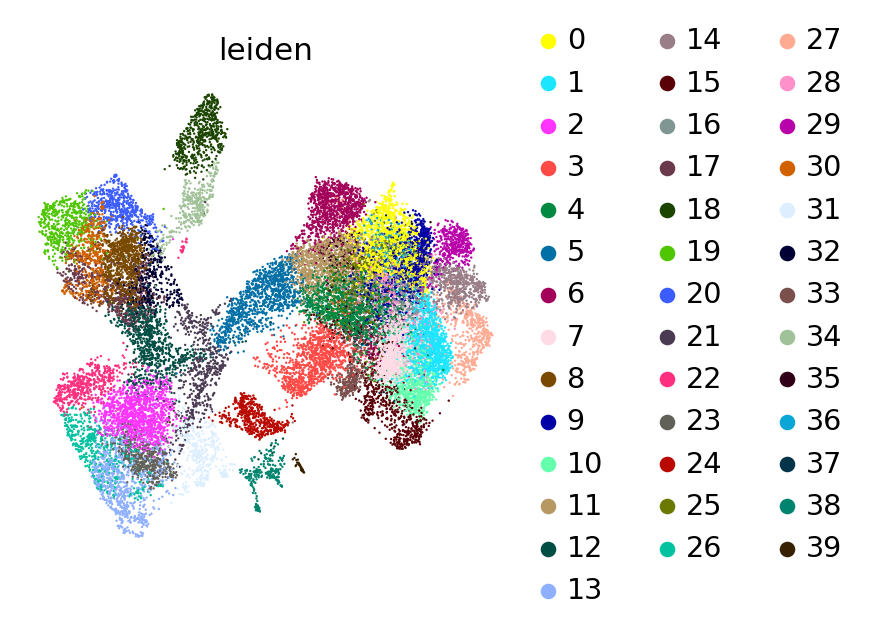

In [94]:
sc.pl.umap(bc_adata, color=['leiden'], frameon=False)

## Finding marker genes

In [95]:
sc.settings.verbosity = 2  # reduce the verbosity

In [96]:
atlas_marker_gene_given_celltype = OrderedDict([
    ('ISC-1', 'Dl'),
    ('ISC-2', 'spdo'),
    ('EEP', 'hdc'),
    ('EB/EEP', 'esg'),
    ('EB-1', 'N'),
    ('EB-2', 'Su(H)'),
    ('dEC', 'nub'),
    ('EE-1', 'pros'),
    ('EE-2', '7B2'),
    ('aEC-1', 'betaTry'),
    ('aEC-2', 'alphaTry'), 
    ('mEC-1', 'thetaTry'),
    ('mEC-2', 'Npc2f'),
    ('pEC-1', 'lambdaTry'),
    ('pEC-2', 'LManVI'),
    ('CopperCells-1', 'Vha100-4'),
    ('CopperCells-2', 'lab'),
    ('LFC-1', 'PGRP-SC1b'),
    ('LFC-2', 'Jon65Ai'),
    ('MT-1', 'Smvt'),
    ('MT-2', 'ct'),
    ('VM-1', 'Gs2'),
    ('VM-2', 'dmGlut'),
    ('VM-3', 'AstC-R2'),
    ('VM-4', 'Dh31-R'),
    ('VM-5', 'Hand'),
    ('VM-6', 'Mef2'),
    ('VM-7', 'how'),
])

atlas_celltypes = list(atlas_marker_gene_given_celltype.keys())
atlas_marker_genes = list(atlas_marker_gene_given_celltype.values())
atlas_celltype_given_marker_gene = OrderedDict([(mg, ct) for ct, mg in atlas_marker_gene_given_celltype.items()])
atlas_labels = ['{} ({})'.format(ct, mg) for ct, mg in atlas_marker_gene_given_celltype.items()]

In [97]:
atlas_celltype_given_marker_gene

OrderedDict([('Dl', 'ISC-1'),
             ('spdo', 'ISC-2'),
             ('hdc', 'EEP'),
             ('esg', 'EB/EEP'),
             ('N', 'EB-1'),
             ('Su(H)', 'EB-2'),
             ('nub', 'dEC'),
             ('pros', 'EE-1'),
             ('7B2', 'EE-2'),
             ('betaTry', 'aEC-1'),
             ('alphaTry', 'aEC-2'),
             ('thetaTry', 'mEC-1'),
             ('Npc2f', 'mEC-2'),
             ('lambdaTry', 'pEC-1'),
             ('LManVI', 'pEC-2'),
             ('Vha100-4', 'CopperCells-1'),
             ('lab', 'CopperCells-2'),
             ('PGRP-SC1b', 'LFC-1'),
             ('Jon65Ai', 'LFC-2'),
             ('Smvt', 'MT-1'),
             ('ct', 'MT-2'),
             ('Gs2', 'VM-1'),
             ('dmGlut', 'VM-2'),
             ('AstC-R2', 'VM-3'),
             ('Dh31-R', 'VM-4'),
             ('Hand', 'VM-5'),
             ('Mef2', 'VM-6'),
             ('how', 'VM-7')])

In [98]:
def cluster_small_multiples(adata, clust_key, size=60, frameon=False, legend_loc=None, categories=None, color=None, **kwargs):
    tmp = adata.copy()

    if categories is None:
        categories = adata.obs[clust_key].cat.categories
    set_color = True if color is None else False
    for i,clust in enumerate(categories):
        if set_color:
            color = adata.uns[clust_key+'_colors'][i]
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype('category')
        tmp.uns[clust+'_colors'] = ['#d2d2d2', color]

    sc.pl.umap(tmp, groups=tmp.obs[clust].cat.categories[1:].values, color=categories, size=size, frameon=frameon, legend_loc=legend_loc, **kwargs)

In [99]:
def plot_by_groups_in_other_label(adata, plot_key, group_key, size=60, frameon=False, legend_loc=None, **kwargs):
    group_vals = adata.obs[group_key].cat.categories

    for i, group_clust in enumerate(adata.obs[group_key].cat.categories):
        tmp = adata.copy()
        tmp = tmp[tmp.obs[group_key] == group_clust, :]
        sc.pl.umap(tmp, color=plot_key, title='{} in {}'.format(plot_key, group_clust), size=size, frameon=frameon, legend_loc=legend_loc, **kwargs)

In [100]:
def get_marker_genes_and_labels(adata, verbose=True):
    genes, labels = [], []
    for gene, ct in atlas_celltype_given_marker_gene.items():
        label = '{} ({})'.format(ct, gene)
        if gene in adata.raw.var.index:
            genes.append(gene)
            labels.append(label)
        elif verbose:
            print('Not found: {}'.format(label))
    return genes, labels

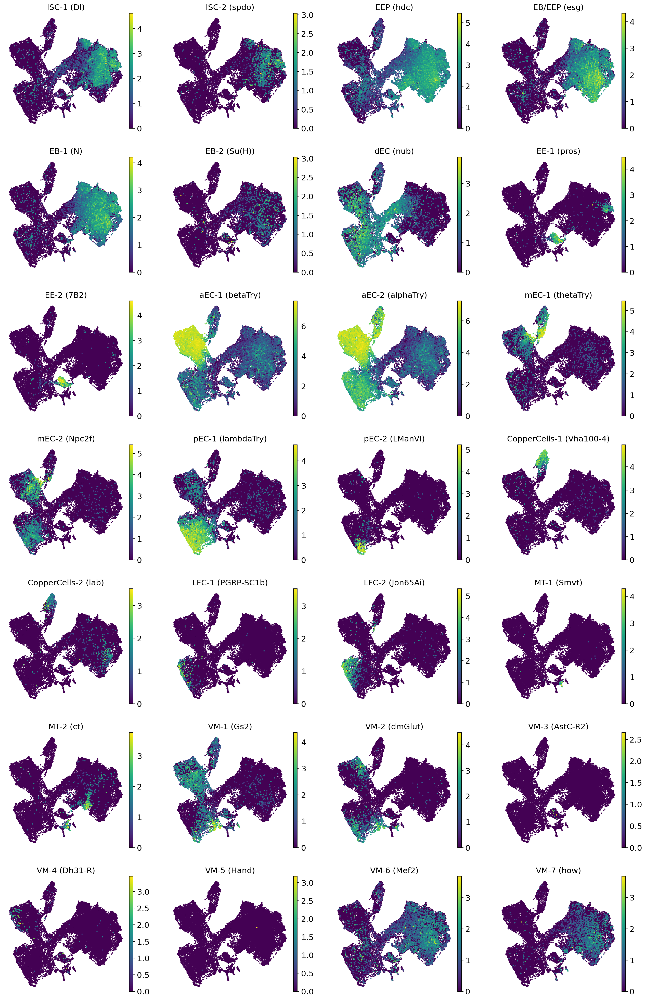

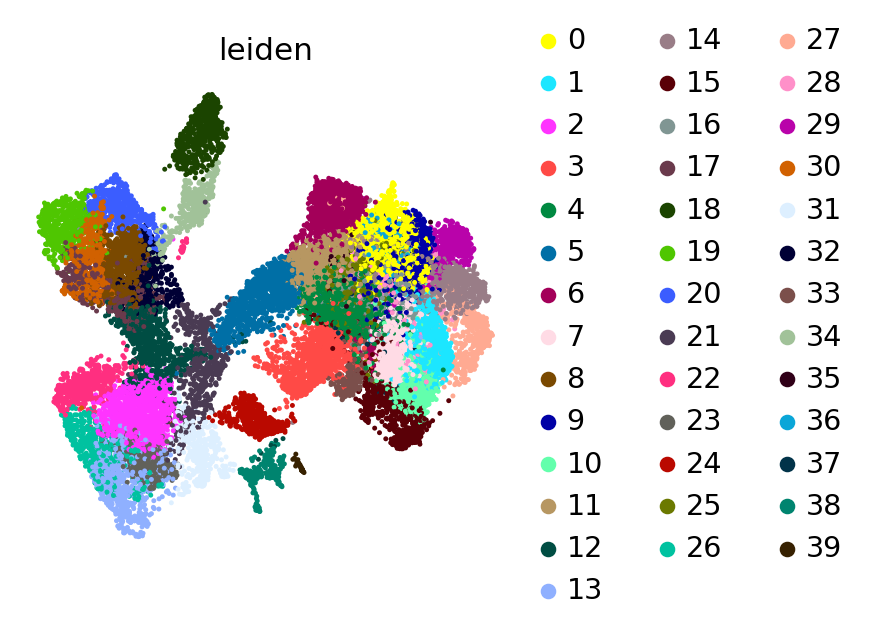

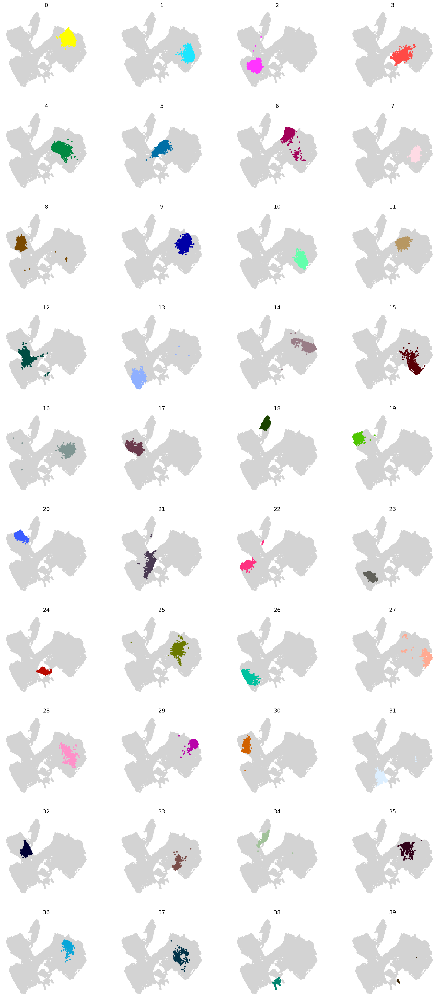

In [101]:
genes, labels = get_marker_genes_and_labels(bc_adata)
sc.pl.umap(bc_adata, color=genes, legend_loc='on data', title=labels, frameon=False, size=20)
sc.pl.umap(bc_adata, color='leiden', frameon=False, size=20)
cluster_small_multiples(bc_adata, 'leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


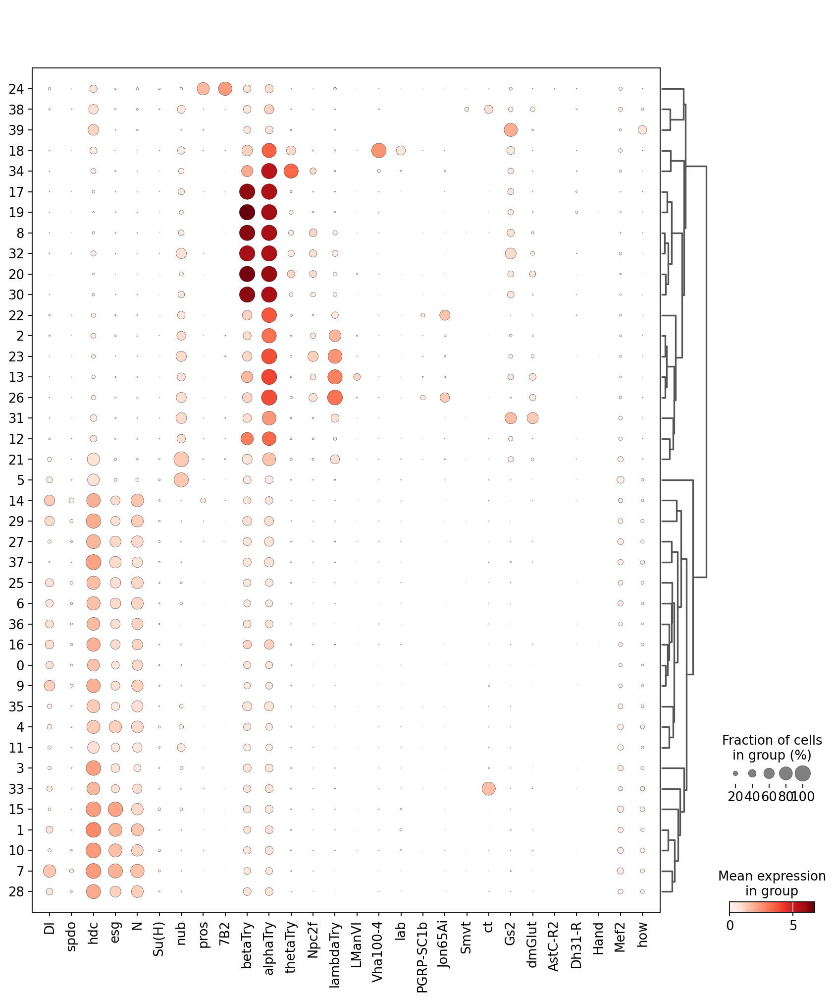

In [102]:
genes, labels = get_marker_genes_and_labels(bc_adata)
sc.pl.dotplot(bc_adata, genes, groupby='leiden', dendrogram=True)

In [103]:
avg_expr_by_cluster = pd.DataFrame(columns=bc_adata.raw.var_names, index=bc_adata.obs['leiden'].cat.categories)
for clust in bc_adata.obs.leiden.cat.categories: 
    avg_expr_by_cluster.loc[clust] = bc_adata.raw[bc_adata.obs['leiden'].isin([clust]),:].X.mean(0)

/scratch/jobs/60613130/ipykernel_2565628/3549458289.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(15, 2))


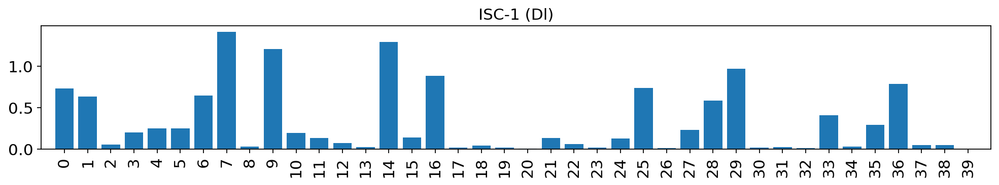

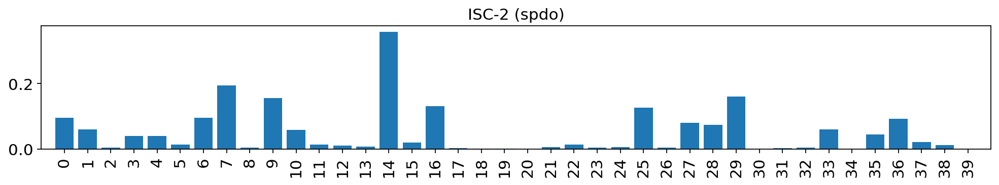

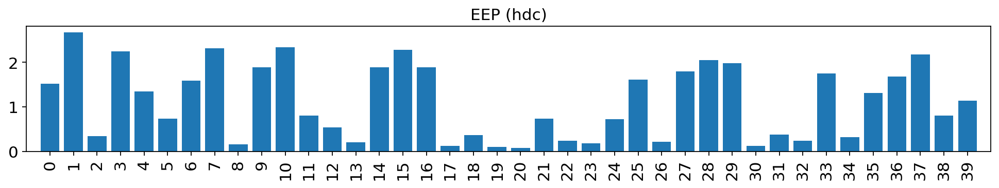

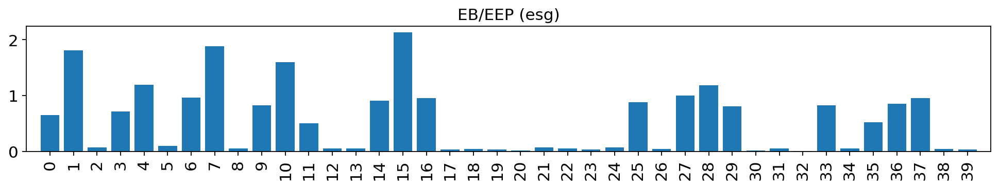

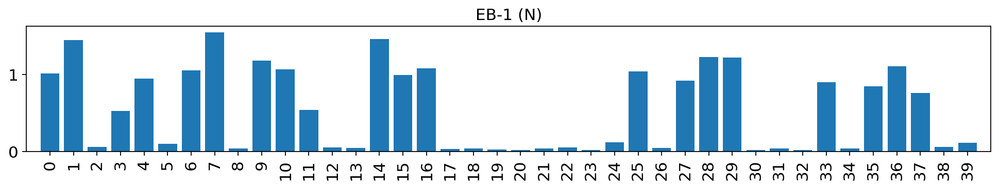

...

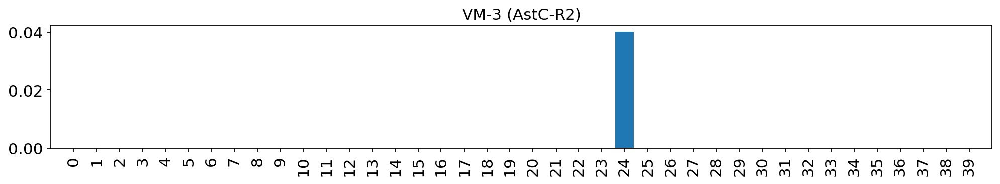

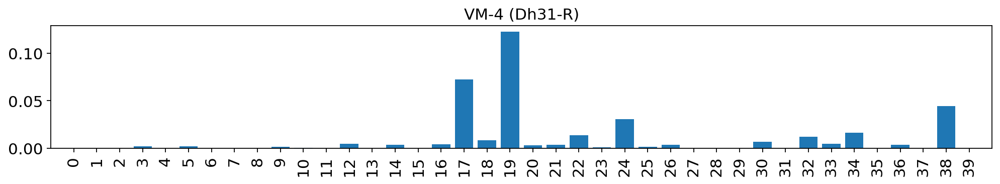

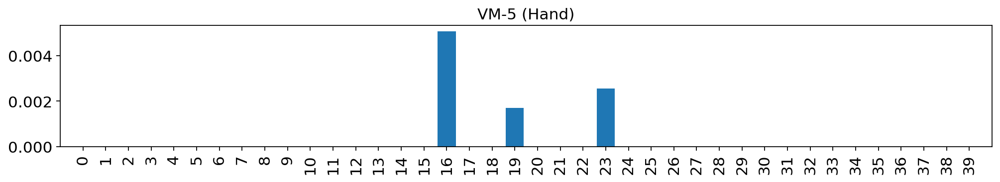

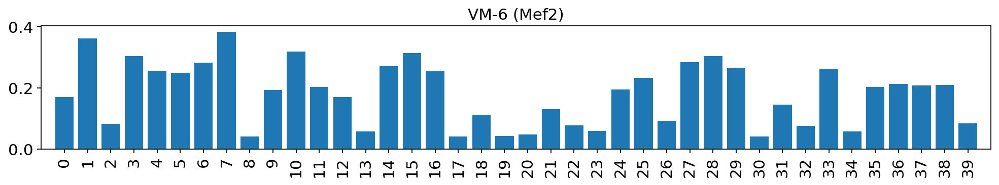

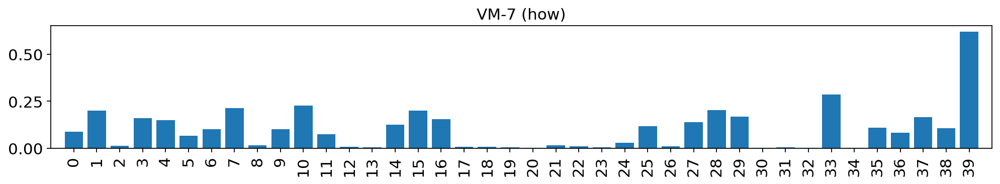

In [104]:
genes, labels = get_marker_genes_and_labels(bc_adata)
for i, (gene, label) in enumerate(zip(genes, labels)):
    fig, ax = plt.subplots(figsize=(15, 2))
    idx = list(map(int, avg_expr_by_cluster.index))
    ax.bar(idx, avg_expr_by_cluster[gene])
    ax.set_xticks(idx)
    ax.set_xticklabels(idx, rotation=90)
    ax.set_title(label)
    ax.grid(False)
    ax.set_xlim((-1, max(idx)+1))

In [105]:
annotation = {
    'ISC': [29, 25, 6, 36, 16, 0, 9, 1, 7, 28],
    'EB': [27, 37, 35, 4, 11, 3, 15, 10],
    'dEC': [5, 12, 21],
    'EEP': [14],
    'dMT': [33],
    'EE': [24],
    'aEC': [17, 19, 8, 32, 20, 30],
    'mEC': [34],
    'pEC': [2, 23, 13],
    'CC': [18],
    'LFC': [22, 26],
    'MT': [38],
    'VM': [39, 31],
}


In [106]:
clusters = ['' for _ in range(bc_adata.n_obs)]
for celltype, leid_list in annotation.items():
    for leid_clst in leid_list:
        clst_label = str(leid_clst)
        for i, val in enumerate(np.in1d(bc_adata.obs['leiden'], clst_label)):
            if val:
                clusters[i] = celltype
bc_adata.obs['celltype'] = clusters

/scratch/jobs/60613130/ipykernel_2565628/3865215492.py:5: DeprecationWarning: `in1d` is deprecated. Use `np.isin` instead.
  for i, val in enumerate(np.in1d(bc_adata.obs['leiden'], clst_label)):


# Celltype calls

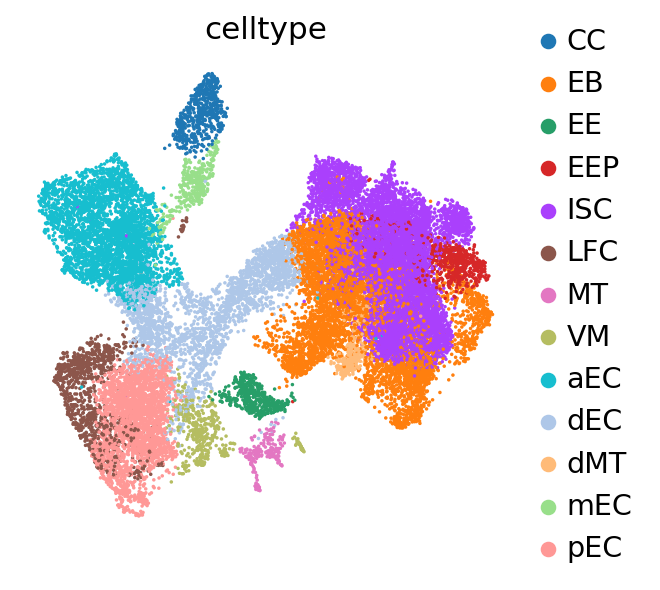

In [107]:
sc.pl.umap(bc_adata, color='celltype', size=10, frameon=False)

In [108]:
colors = sc.pl.palettes.vega_20
#cluster_celltypes = ['ISC/Dl+', 'ISC/EB', 'EE', 'aEC', 'daEC', 'mEC', 'pEC', 'esg-', 'dEE', 'other']
cluster_celltypes = list(annotation.keys())
cluster_colors = {
    celltype: color for celltype, color in zip(cluster_celltypes, colors)
}   
cluster_colors[''] = '#d3d3d3'

for j, clust in enumerate(bc_adata.obs['celltype'].cat.categories):
    bc_adata.uns['celltype_colors'][j] = cluster_colors[clust]

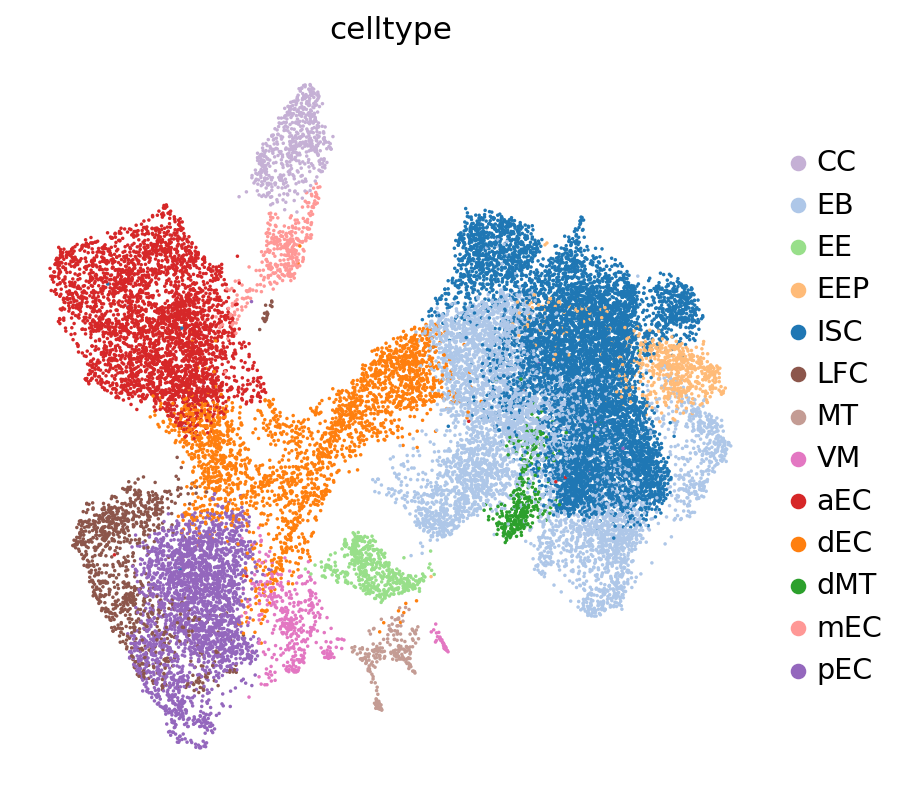

In [109]:
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(bc_adata, color='celltype', size=10, frameon=False, ax=ax)
fig.savefig('figures/ct_umap.pdf')
fig.savefig('figures/ct_umap.png', dpi=300)

# Clones

In [110]:
bc_adata.obs['clone_id']

AAACCTGAGAAACGCC-1-TX46 ctrl-0                                                     
AAACCTGAGCTGCAAG-1-TX46 ctrl-0                                                     
AAACCTGCAAGCCCAC-1-TX46 ctrl-0                                                     
AAACCTGGTCAATGTC-1-TX46 ctrl-0                                                     
AAACCTGGTCCATCCT-1-TX46 ctrl-0                                                     
                                                        ...                        
TTTGTCACAGAAGCAC-1-TX45 LamC-5    TX45 LamC C14572824T,J14572847_14575223>-22_+0...
TTTGTCAGTTAAAGAC-1-TX45 LamC-5                                                     
TTTGTCAGTTTCGCTC-1-TX45 LamC-5                                                     
TTTGTCATCGCCAAAT-1-TX45 LamC-5                                                     
TTTGTCATCTGGAGCC-1-TX45 LamC-5                                                     
Name: clone_id, Length: 26068, dtype: category
Categories (3012, object): ['

In [111]:
clones_with_pEC, clones_with_aEC = [], []
for run_label in run_labels:
    if 'ctrl' in run_label:
        continue
    clones = [cat for cat, count in clone_id_cntr_given_run_label[run_label].most_common() if cat != '' and count > 1]
    n_cells_in_clones = sum([count for cat, count in clone_id_cntr_given_run_label[run_label].most_common() if cat != '' and count > 1])
    aEC_count, pEC_count, mEC_count = [], [], []
    stem_count = []
    for clone in clones:
        tmp = bc_adata[bc_adata.obs['clone_id'] == clone]
        cntr = Counter(tmp.obs['celltype'])
        aEC_count.append(cntr['aEC'])
        mEC_count.append(cntr['mEC'])
        pEC_count.append(cntr['pEC'] + cntr['LFC/pEC'])
        stem_count.append(cntr['ISC'] + cntr['EB'])
    for clone, a, p, m in zip(clones, aEC_count, pEC_count, mEC_count):
        if p > 0 and a==0 and m==0:
            clones_with_pEC.append(clone)
        if p == 0 and a>0 and m==0:
            clones_with_aEC.append(clone)

In [112]:
in_pEC = np.isin(bc_adata.obs.clone_id, clones_with_pEC)
in_aEC = np.isin(bc_adata.obs.clone_id, clones_with_aEC)
clone_aEC_pEC = []
for op, oa in zip(in_pEC, in_aEC):
    assert(op+oa <= 1)
    if op:
        s = 'pEC'
    elif oa:
        s = 'aEC'
    else:
        s = ''
    clone_aEC_pEC.append(s)
bc_adata.obs['clone_aEC_pEC'] = clone_aEC_pEC

In [113]:
target_info = yaml.load(open('/g/stegle/hawkins/decode/annotation/dm6/annotation/targets.yml'), Loader=yaml.FullLoader)

In [114]:
target_info[goi]['targets']

{'t1': {'cutsite': 20995489,
  'end': 20995506,
  'seq': 'CAGTTCTGAGGTCAGCACAT',
  'start': 20995486,
  'strand': '-'},
 't2': {'cutsite': 20994988,
  'end': 20994991,
  'seq': 'ATTGGTATATTCCTTAGCAA',
  'start': 20994971,
  'strand': '+'}}

In [115]:
def t1_or_t2(mut, goi):
    ts = ['t1', 't2']
    cutsite = {t: target_info[goi]['targets'][t]['cutsite'] for t in ts}
    mut_type, ref_pos_start, ref_pos_end, bases = parse_mutation(mut)
    if ref_pos_start > ref_pos_end: ref_pos_start, ref_pos_end = ref_pos_end, ref_pos_start
    if mut_type == 'del':
        dists = {t: 0 if ref_pos_start <= cutsite[t] <= ref_pos_end else min(abs(cutsite[t] - ref_pos_start), abs(cutsite[t] - ref_pos_end)) for t in ts}
    else:
        dists = {t: abs(cutsite[t] - ref_pos_start) for t in ts}
    t12_dist = abs(cutsite['t1'] - cutsite['t2'])
    return 'both' if all(v < t12_dist/2 for v in dists.values()) else min(ts, key=lambda t: dists[t])

In [116]:
ts = ['t1', 't2']
all_ts = ts + ['t1-both', 'both', 't2-both']

def separate_chrm_muts_into_t12_both(chrm):
    sorted_muts = defaultdict(list)
    if chrm != 'wt':
        for mut in chrm.split(','):
            sorted_muts[t1_or_t2(mut, goi)].append(mut)
    if 'both' in sorted_muts:
        return [('t1-both', tuple(sorted_muts['t1'])), ('both', tuple(sorted_muts['both'])), ('t2-both', tuple(sorted_muts['t2']))]
    return [(t, tuple(sorted_muts[t])) for t in ts]

In [117]:
t12_mut_cntr_given_goi_given_tx = {goi: {tx: defaultdict(Counter) for tx in txs} for goi in gois}
for goi in gois:
    for tx in txs:
        pert_tx_clone_ids = [ci.split()[-1] for ci in bc_adata.obs['clone_id'] if '/' in ci and ci.split()[0] == tx and goi in ci]
        for ci in set(pert_tx_clone_ids): 
            for chrm in ci.split('/'):
                if chrm == 'wt':
                    for t in ts:
                        t12_mut_cntr_given_goi_given_tx[goi][tx][t][tuple()] += 1  # represent wt at a location as tuple()
                else:
                    t_and_muts_list = separate_chrm_muts_into_t12_both(chrm)
                    for t, mut_tup in t_and_muts_list:
                        t12_mut_cntr_given_goi_given_tx[goi][tx][t][mut_tup] += 1

for goi in gois:
    print(f'{goi} mut sigs: {sum(v for tx in txs for t in all_ts for v in t12_mut_cntr_given_goi_given_tx[goi][tx][t].values()):,d}')

LamC mut sigs: 8,873
Prosalpha3 mut sigs: 3,267


In [118]:
t12_mut_cntr_given_goi = {goi: defaultdict(Counter) for goi in gois}
for goi in gois:
    for tx in txs:
        for t in all_ts:
            for k, v in t12_mut_cntr_given_goi_given_tx[goi][tx][t].items():
                t12_mut_cntr_given_goi[goi][t][k] += v

for goi in gois:
    print(f'{goi} mut sigs: {sum(v for t in all_ts for v in t12_mut_cntr_given_goi[goi][t].values()):,d}')

LamC mut sigs: 8,873
Prosalpha3 mut sigs: 3,267


In [119]:
p_both_given_goi = {}
for goi in gois:
    t_denom = sum(t12_mut_cntr_given_goi[goi]['t1'].values())
    both_denom = sum(t12_mut_cntr_given_goi[goi]['both'].values())
    p_both_given_goi[goi] = np.exp(np.log(float(both_denom)) - np.log(t_denom+both_denom))
p_both_given_goi

{'LamC': np.float64(0.02026411657559198),
 'Prosalpha3': np.float64(0.0042944785276073615)}

In [120]:
def find_all_mutations_at_target(goi, t):
    return [mut for k in t12_mut_cntr_given_goi[goi][t].keys() for mut in k]

def find_mut_range_limits_at_targets(goi):
    loc_targets = ['t1', 't2']
    mut_range = {t: {mut_type: {'min': float('inf'), 'max': float('-inf')} 
                  for mut_type in ['ins', 'del', 'sub', 'splice']}
                 for t in loc_targets}
    for t in loc_targets:
        for mut in find_all_mutations_at_target(goi, t):
            mut_type, s, e, b = parse_mutation(mut)
            mut_range[t][mut_type]['min'] = min(s, mut_range[t][mut_type]['min'])
            mut_range[t][mut_type]['max'] = max(e, mut_range[t][mut_type]['max'])
    return mut_range

def find_mut_range_limits_at_both(goi):
    both_range = {end: {'min': float('inf'), 'max': float('-inf')} for end in ['left', 'right']}
    for mut in find_all_mutations_at_target(goi, 'both'):
        mut_type, s, e, b = parse_mutation(mut)
        assert mut_type == 'del', mut
        for v, fn in [('min', min), ('max', max)]:
            both_range['left'][v] = fn(s, both_range['left'][v])
            both_range['right'][v] = fn(e, both_range['right'][v])
    return both_range

In [121]:
genome_fpath = '/home/hawkins/workspace/decode/annotation/dm6/ensembl/Drosophila_melanogaster.BDGP6.28.dna.toplevel.fa'
genome = SeqIO.to_dict(SeqIO.parse(open(genome_fpath), 'fasta'))

In [122]:
def iterate_del(del_mn, del_mx):
    for del_i in range(del_mn, del_mx+1):
        for del_j in range(del_i, del_mx+1):
            yield del_i, del_j, f'D{del_i}-{del_j}'

def iterate_ins(ins_mn, ins_mx, max_ins_len=3):
    for i in range(ins_mn, ins_mx):
        for n_bases in range(1, max_ins_len+1):
            for samp in itertools.product(*['ACGT']*n_bases):
                b = ''.join(samp)
                yield i, f'I{i}{b}'

def iterate_sub(sub_mn, sub_mx, goi):
    chrm = target_info[goi]['chrm']
    for i in range(sub_mn, sub_mx):
        ref_b = genome[chrm][i]
        for alt_b in 'ACGT'.replace(ref_b, ''):
            yield i, f'{ref_b}{i}{alt_b}'

def fake_mut(goi, t):
    if t.startswith('t'):
        cutsite = target_info[goi]['targets'][t[:2]]['cutsite']
        return f'A{cutsite}A'
    else:
        assert t == 'both', t
        starts = [target_info[goi]['targets'][loc_t]['start'] for loc_t in ['t1', 't2']]
        return f'D{min(starts)}-{max(starts)}'

def inc_if_missing(goi, t, mut_list):
    mut_sig = tuple(mut_list)
    if mut_sig not in t12_mut_cntr_given_goi[goi][t]:
        t12_mut_cntr_given_goi[goi][t][tuple([fake_mut(goi, t)])] += 1

In [123]:
for goi in gois:
    assert tuple([fake_mut(goi, 'both')]) not in t12_mut_cntr_given_goi[goi]['both'], fake_mut(goi, 'both')

In [124]:
# Smoothing
for goi in gois:
    # First add to all existing edits
    for t in all_ts:
        for k in t12_mut_cntr_given_goi[goi][t].keys():
            t12_mut_cntr_given_goi[goi][t][k] += 1
            
    # Then add one to all edits in the realm of consideration if they are not in the dataset

    t12_limits = find_mut_range_limits_at_targets(goi)
    both_limits = find_mut_range_limits_at_both(goi)

    for t in ['t1', 't2']:
        # Combine Insertion and Sub ranges
        r_mn = min([t12_limits[t][mut_type]['min'] for mut_type in ['sub', 'ins']])
        r_mx = max([t12_limits[t][mut_type]['max'] for mut_type in ['sub', 'ins']])

        del_mn, del_mx = [t12_limits[t]['del'][v] for v in ['min', 'max']]
        # Add single deletions
        for i, j, d in iterate_del(r_mn, r_mx): #del_mn, del_mx): Way too much probability to these crazy long ranges
            inc_if_missing(goi, t, [d])

        def loc_it_sub(start):
            for i, sub_i in iterate_sub(start, r_mx, goi):
                yield i, sub_i
        def loc_it_ins(start):
            for i, ins_i in iterate_ins(start, r_mx):
                yield i, ins_i
        def loc_it_del(start):
            for i, j, del_i in iterate_del(start, r_mx):
                yield j, del_i

        # Add singles of ins and sub
        for it_1 in [loc_it_sub, loc_it_ins]:
            for i, mut_i in it_1(r_mn):
                inc_if_missing(goi, t, [mut_i])
                inc_if_missing(goi, f'{t}-both', [mut_i])
        

    # Add dels at both
    for i in range(both_limits['left']['min'], both_limits['left']['max']):
        for j in range(both_limits['right']['min'], both_limits['right']['max']):
            d = f'D{i}-{j}'
            inc_if_missing(goi, 'both', [d])

In [125]:
t12_mut_pdict_given_goi = {goi: {t: {} for t in all_ts} for goi in gois}
t12_mut_list_given_goi = {goi: {t: [] for t in all_ts} for goi in gois}
t12_mut_ps_list_given_goi = {goi: {t: [] for t in all_ts} for goi in gois}
for goi in gois:
    for t in all_ts:
        denom = sum(t12_mut_cntr_given_goi[goi][t].values())
        for mut, count in t12_mut_cntr_given_goi[goi][t].items():
            p = np.exp(np.log(count)-np.log(denom))
            t12_mut_pdict_given_goi[goi][t][mut] = p
            t12_mut_list_given_goi[goi][t].append(mut)
            t12_mut_ps_list_given_goi[goi][t].append(p)

In [126]:
def sample_random_chrm(goi):
    if random.random() < p_both_given_goi[goi]:
        loc_ts = all_ts[2:]
    else:
        loc_ts = ts
    mut_tups = [t12_mut_list_given_goi[goi][t][np.random.choice(range(len(t12_mut_list_given_goi[goi][t])), p=t12_mut_ps_list_given_goi[goi][t])] for t in loc_ts]
    chrm = ','.join(sorted(itertools.chain(*mut_tups), key=lambda mut: parse_mutation(mut)[1]))
    return chrm if chrm else 'wt'

def sample_random_clone(goi):
    return sample_random_chrm(goi) + '/' + sample_random_chrm(goi)


def logp_chrm(chrm, goi):
    sorted_muts = separate_chrm_muts_into_t12_both(chrm)
    p_t12_or_both = p_both_given_goi[goi] if len(sorted_muts) == 3 else 1-p_both_given_goi[goi]
    return np.log(p_t12_or_both) + np.sum(np.log([t12_mut_pdict_given_goi[goi][t][mut_tup] for t, mut_tup in sorted_muts]))
    
def logp_clone(ci, goi):
    return sum(logp_chrm(chrm, goi) for chrm in ci.split()[-1].split('/'))


In [127]:
likely_dup_clone_ids = []
for goi in gois:
    for tx in txs:
        pert_tx_clone_ids = [ci.split()[-1] for ci in bc_adata.obs['clone_id'] if '/' in ci and ci.split()[0] == tx and goi in ci]
        n_clones = len(pert_tx_clone_ids)
        # TX
        ps = np.exp([logp_clone(ci, goi) for ci in pert_tx_clone_ids])
        p_2plus = 1 - (1-ps)**n_clones - comb(n_clones, 1)*ps * (1-ps)**(n_clones-1)
        p_2plus = [max(0, p) for p in p_2plus]
        p_2plus_given_clone = {ci: p for p, ci in zip(p_2plus, pert_tx_clone_ids)}
        for ci, p in p_2plus_given_clone.items():
            if p >= 0.005:
                likely_dup_clone_ids.append(f'{tx} {goi} {ci}')

In [128]:
bc_adata.obs['unique_clone'] = [bool(ci not in likely_dup_clone_ids) for ci in bc_adata.obs['clone_id']]

# Save final result

### Clean obs

In [129]:
out_adata = bc_adata.copy()

In [130]:
list(out_adata.obs.columns)

['n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'n_genes',
 'leiden',
 'batch',
 'mut_sig',
 'het_hom_status',
 'het_hom_with_uncalled_status',
 'indel_lens',
 'maternal_indel_len',
 'paternal_indel_len',
 'wtlike_status',
 'clone_id',
 'clone_cell_ct',
 'mut_sig_with_uncalled',
 'batch_idx',
 'rep',
 'perturbation',
 'celltype',
 'clone_aEC_pEC',
 'unique_clone']

In [131]:
out_adata.obs.drop(columns='indel_lens', inplace=True) # numerical values

### Clean var

In [132]:
list(out_adata.var.columns)

['gene_ids-TX45 LamC',
 'feature_types-TX45 LamC',
 'mt-TX45 LamC',
 'n_cells_by_counts-TX45 LamC',
 'mean_counts-TX45 LamC',
 'pct_dropout_by_counts-TX45 LamC',
 'total_counts-TX45 LamC',
 'n_cells-TX45 LamC',
 'highly_variable-TX45 LamC',
 'means-TX45 LamC',
 'dispersions-TX45 LamC',
 'dispersions_norm-TX45 LamC',
 'gene_ids-TX45 Prosalpha3',
 'feature_types-TX45 Prosalpha3',
 'mt-TX45 Prosalpha3',
 'n_cells_by_counts-TX45 Prosalpha3',
 'mean_counts-TX45 Prosalpha3',
 'pct_dropout_by_counts-TX45 Prosalpha3',
 'total_counts-TX45 Prosalpha3',
 'n_cells-TX45 Prosalpha3',
 'highly_variable-TX45 Prosalpha3',
 'means-TX45 Prosalpha3',
 'dispersions-TX45 Prosalpha3',
 'dispersions_norm-TX45 Prosalpha3',
 'gene_ids-TX45 ctrl',
 'feature_types-TX45 ctrl',
 'mt-TX45 ctrl',
 'n_cells_by_counts-TX45 ctrl',
 'mean_counts-TX45 ctrl',
 'pct_dropout_by_counts-TX45 ctrl',
 'total_counts-TX45 ctrl',
 'n_cells-TX45 ctrl',
 'highly_variable-TX45 ctrl',
 'means-TX45 ctrl',
 'dispersions-TX45 ctrl',
 'dis

In [133]:
mt_cols = [v for v in list(out_adata.var.columns) if v.startswith('mt-')]
mt_cols

['mt-TX45 LamC',
 'mt-TX45 Prosalpha3',
 'mt-TX45 ctrl',
 'mt-TX46 LamC',
 'mt-TX46 Prosalpha3',
 'mt-TX46 ctrl']

In [134]:
out_adata.var.drop(columns=mt_cols, inplace=True)

In [135]:
hv_cols = [v for v in list(out_adata.var.columns) if v.startswith('highly_variable')]
hv_cols

['highly_variable-TX45 LamC',
 'highly_variable-TX45 Prosalpha3',
 'highly_variable-TX45 ctrl',
 'highly_variable-TX46 LamC',
 'highly_variable-TX46 Prosalpha3',
 'highly_variable-TX46 ctrl',
 'highly_variable']

In [136]:
out_adata.var.drop(columns=hv_cols, inplace=True)

### Write

In [137]:
out_fpath = 'write/scptseq_adata.h5ad'
out_adata.write(out_fpath)